# Capstone proposal by Valentin

# CRM Predictions

# 3 - Problem, Data, EDA

This notebook is a template for your project proposal.

> The details are outlined in the **Proposal** unit on the platform - you should address all points from those instructions with as many markdown/code cells as needed. This should include code, observations, discussions and the planned steps.

Importing libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import numpy as np
from IPython.display import Image

sns.set_style('darkgrid')

## 1) The problem
What is the wider context of your problem and what story you would like to tell with the data?
What problem would you like to address?

> Our goal is knowing how well we can predict future customer class based on today's information

### CRM vocabulary.

In the following, these terms are used
- Contact : can be either a prospect or a customer.
- Prospect : brand registrant without purchase (contact who have sign up but never transacted).
- Customer : brand registrant with purchase (contact who have at least one purchase in his entire life)
- Recruitment channel or Source channel : flag indicating the channel of recruitment : offline (in a point of sales) or online (website).

#### What is RFM

From my experience working at L'Oréal, customer relationship management (CRM) programs need to identify and leverage differences across customers to be successful. This becomes difficult especially with new customers, as they have only made one purchase and lack repeated observations.

The goal would be to understand what drives differences across recently acquired customers and what characteristics may reflect underlying preferences and attitudes. For this, one of the methodology is to use RFM segmentation

**What is RFM segmentation ?** RFM analysis is a customer segmentation technique that stands for **Recency, Frequency, and Monetary**. These are indicators of customer behavior, each one reflects a different aspect of customer engagement.

- **Recency** refers to the amount of time since a customer's last purchase, and is a key factor in determining their level of engagement. Customers who have made a purchase more recently are more likely to be retained, while those who have not made a purchase in a long time may be at risk of churning. 
> Here our recency indicator is `days_since_last_order`

- **Frequency** measures how often a customer makes a purchase. Customers who purchase frequently are generally more satisfied and engaged.
> Frequency indicator is number of orders in last 2 years `orders_24m
`.

- **Monetary** reflects the amount of money that a customer has spent with the business. This metric is important because it helps to differentiate high-value customers from low-value ones.
> Monetary indicator is amount of orders in last 2 years `order_amount_24m`.

Our RFM Segmentation splits database in the following segments

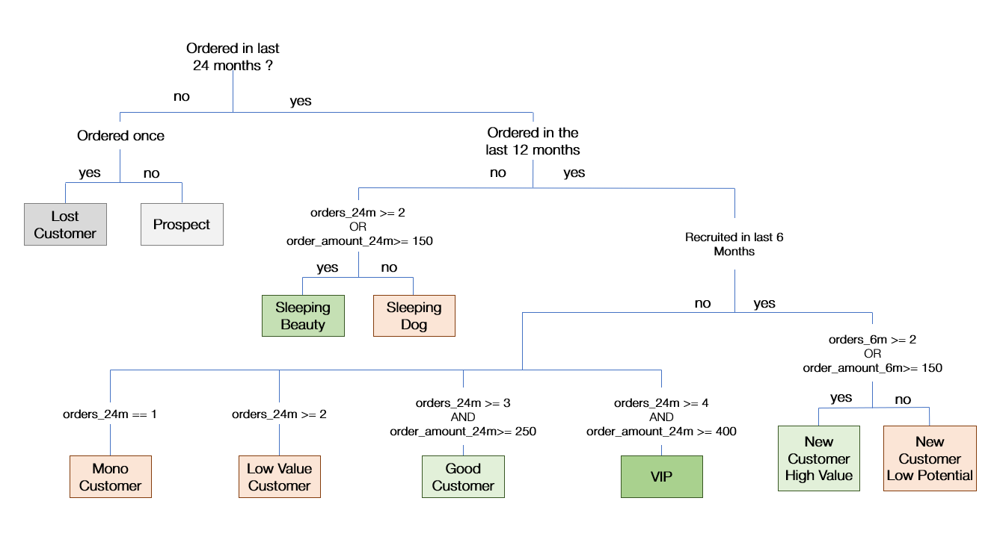

In [2]:
Image(filename='RFM.png', width=900, height=900)

The quality of RFM segmentation presented above is not its mathematical perfection, but the fact it comes from pre existing norms used by Management. In fact, one of the important factor to take into consideration when building RFM is industry recency norms for instance (how frequent should a customer buy a product, not the same answer for a car or a tomato).

To rephrase, the main advantage of RFM is readability across the organization and we will try to make predictions on RFM label, knowing that there might be better statistical methods to assign labels.

#### Why RFM predictions matter


The whole point of RFM prediction is to use pre existing norms of database evaluation, RFM classes, and try to make them less static by using predicted RFM class to infer marketing recommendations. If we manage a better level of accuracy that say, a baseline of no change (the predicted class is today's class), this means we can start acting on the predicted customer class. Examples include

- **Differentiating first order offer** Not offering the same first order offer depending on what would be the next class of a prospect. If a prospect is going to convert into a loyal or a one-time customer, there might be different products or different promo strategies we can use to influence. If a prospect is not predicted to convert, we can perhaps push content as a first strategy.
> An example of that is predictions based only socio demographic data (place of living, name, age ...) to offer premium beauty service, for instance a 1 hour one-to-one consultation with a beauty advisor in a point of sales
- **Preventing churn on most loyal customers**. Retention drives customer lifetime value, the definition of retention being year on year retained consumers.
> Traditional example is "miss-you" email where you send an offer 6 months after last purchase. These could be personalized in their timing (offer sent by email earlier than normal, as the longer we wait, the higher the risk of customer switching brand and losing engagement) and in the nature of the offer.
- **Nudging customer into a better class**. In CRM, it proves often valuable to increase generosity (meaning % of sales you give back to customer as advantages). Based on prediction, it could prove a good A/B testing strategy to increase generosity on segments that are predicted to go to a higher category to nudge them, or else said reinforced predicted behavior. 
> Same here, we would be differentiating offers based on predicted label. If you are predicted to go VIP you get a mini product or a pouch, if you are predicted to go to a lower class, you get standard samples.



## 2) The data

### (a) Clear overview of your data

#### i) Source and context
> Source and context of the dataset, provide the relevant links

This data is a sampled anonymized data from cosmetics brands, mixing contacts, orders and tracking. 

You can find details of SQL queries used in __SQL Queries.ipynb__.

And details of how data was generated in __dataset_creation.ipynb__.

Both end up generating snapshots of the database at dates of interval of 30 days. For example, if date of snapshot is 05/01/2022
- All contacts recruited after 5th January 2022 are not removed from snapshot.
- Only orders and tracking element (email clicks, emails opens) before 05/01/2022 are kept 
- All contacts class (for instance, if contact is a prospect or already purchased is a customer) are then reconstructed.

##### Loading dataset

We make sure timedelta are loaded as such using read_pickle by defining data types before

In [3]:
# Define data types for each variable
dtypes = {
    'days_until_first_order': 'timedelta64[ns]',
    'days_since_acquisition': 'timedelta64[ns]',
    'days_since_last_order': 'timedelta64[ns]'
}

In [4]:
# Load the pickle file and set the data types for each variable
df = pd.read_pickle('./dataset.pkl')
df = df.astype(dtypes)
df.columns

Index(['customer_id', 'acquisition_date', 'language', 'gender',
       'recruitment_source', 'zip_code', 'birthdate', 'email_domain',
       'email_domain_type', 'total_orders', 'orders_15d', 'orders_1m',
       'orders_3m', 'orders_6m', 'orders_12m', 'orders_18m', 'orders_24m',
       'order_amount_15d', 'order_amount_1m', 'order_amount_3m',
       'order_amount_6m', 'order_amount_12m', 'order_amount_18m',
       'order_amount_24m', 'total_orders_amount', 'first_order_date',
       'last_order_date', 'last_online_order_date', 'last_offline_order_date',
       'generation_month', 'generation_date', 'days_until_first_order',
       'days_since_acquisition', 'days_since_last_order', 'rfm_labels',
       'purchase_channel', 'promo_rate', 'top_category', 'top_subcategory',
       'top_franchise', 'top_item', 'category_diversity',
       'subcategory_diversity', 'franchise_diversity', 'item_diversity',
       'first_order_cat_diversity', 'first_order_subcat_diversity',
       'first_order_t

We investigate whether we have some dominant class in RFM Labels

In [5]:
df['rfm_labels'].value_counts(normalize=True)

Lost Customer                 0.219417
Sleeping Dog                  0.198008
Mono Customer                 0.136303
Low Value Customers           0.131015
Sleeping Beauty               0.083693
New Customer Low Potential    0.081731
VIP                           0.060489
Good Customers                0.050155
New Customer High Value       0.025004
Prospect                      0.014186
Name: rfm_labels, dtype: float64

As can be excepted, classes of lower engagement, required lower levels of interation, meaning fewer or lesser purchases are more represented :
- Sleeping Dog is someone with only one order in last 24 months but not in last 12 months
- Mono Customer is one order only 24 months and this order is in the last 12months

We will have to keep in mind class imbalance as potential issue going forward.

#### RFM in our dataset

Now we try out a few different visualization to see the state of rfm_label in our dataset. Objectives are 
- Are rfm_labels differentiating database enough. We might have some flexibility readjusting thresholds for defining for instance a new customer between low potential and high value (at the moment it is 150CHF OR 2 Orders at least in last 6 months). The rules for new customer being calculated on last 6 months, or 12 months for recency between sleeping and other customers are defined beforehand by business.
- We did this before starting EDA, as we slightly changed rules of differentiating customer class and regenerated dataset. 

In [6]:
# Create a mapping of segment labels to integer values
class_map = {
    'Prospect': 0,
    'Lost Customer': 1,
    'Sleeping Dog': 2,
    'Sleeping Beauty': 3,
    'New Customer Low Potential': 4,    
    'New Customer High Value': 5,
    'Low Value Customers': 6,
    'Mono Customer': 7,
    'Good Customers': 8,
    'VIP': 9    
}

class_names = list(class_map.keys())
class_labels = list(class_map.values())

Here, we define a color map we will re use over multiple chart. Goal is to improve readability by assigning to positive rfm label green shades and negative red shades. 

In [7]:
# Define color map
cmaps_greens = plt.get_cmap('Greens')
cmaps_reds = plt.get_cmap('Reds')
cmaps_greys = plt.get_cmap('Greys')

class_colors = {
    'Prospect': cmaps_greys(0.6),
    'Lost Customer': cmaps_greys(0.8),
    'Sleeping Dog': cmaps_reds(0.6),
    'Sleeping Beauty': cmaps_greens(0.8),
    'New Customer Low Potential': cmaps_reds(0.4),    
    'New Customer High Value': cmaps_greens(0.7),
    'Low Value Customers': cmaps_reds(0.5),
    'Mono Customer': cmaps_reds(0.7),
    'Good Customers': cmaps_greens(0.6),
    'VIP': cmaps_greens(0.7)    
}

##### RFM Summary table

We investigate Recency, Frequency, Monetary mean, std, min and max for each rfm_label

In [8]:
df['days_since_last_order'] = df['days_since_last_order'].dt.days.astype('float64')

In [9]:
df_grouped = df[['days_since_last_order', 'order_amount_24m', 'orders_24m', 'rfm_labels']]\
.groupby('rfm_labels')\
.agg({'mean', 'std', 'min', 'max'})


df_grouped['num_records'] = df.groupby('rfm_labels').size()
df_grouped.fillna(0, inplace=True) 
df_grouped = df_grouped.astype(int)
df_grouped

days_since_last_order                  \
                                             std mean  min   max   
rfm_labels                                                         
Good Customers                                98  135    0   364   
Lost Customer                                105  908  730  1094   
Low Value Customers                          102  168    0   364   
Mono Customer                                 88  238    0   364   
New Customer High Value                       48   67    0   180   
New Customer Low Potential                    51   88    0   301   
Prospect                                       0    0    0     0   
Sleeping Beauty                               96  505  365   729   
Sleeping Dog                                 106  549  365   729   
VIP                                           86   97    0   364   

                           order_amount_24m                 orders_24m       \
                                        std mean  min   max        std mean   
rfm_labels                                                                    
Good Customers                           95  347  250  2040          1    3   
Lost Customer                            51   75   10   326          0    1   
Low Value Customers                      83  172   17  1477          0    2   
Mono Customer                            55   79    6   945          0    1   
New Customer High Value                 113  208   24  1124          0    1   
New Customer Low Potential               35   67    6   404          0    1   
Prospect                                  0    0    0     0          0    0   
Sleeping Beauty                         132  208   17  2288          1    2   
Sleeping Dog                             33   65    7   149          0    1   
VIP                                     449  781  400  6070          3    7   

                                   num_records  
                           min max              
rfm_labels                                      
Good Customers               3  12       13241  
Lost Customer                1   3       57926  
Low Value Customers          2  12       34588  
Mono Customer                1   1       35984  
New Customer High Value      1  11        6601  
New Customer Low Potential   1   3       21577  
Prospect                     0   0        3745  
Sleeping Beauty              1  17       22095  
Sleeping Dog                 1   1       52274  
VIP                          4  46       15969

Monetary
- Average values for Good customers are 100 above threshold with acceptable variance. 
- Sleeping Beauty and New Customers High value average at the same values which indicates Sleeping beauty are mostly made of New Customers that did not repurchase after 6 months (standard deviation slightly higher for Sleeping Beauty). 
- Lost Customer (ordered after 24 months), Sleeping dog (ordered once in 12-24 months range), Mono Customers (ordered once in 6-12 months range), New Customer Low Potential (ordered oncei n 0-6 months range) have very similar mean monetary values, which indicates they are similar customers ordering once and never ordering again, only shifting accross time.

Frequency
- 'Capped' at 1 for Lost, Sleeping dog, Mono and New Customer Low Potential. This is telling us that existing business norms are essentially limitating the value of the frequency parameter, trade of between flexibility and readability to management.

Recency
- While being capped by class in terms of min and max, it is interesting to see that for instance VIP and Good Customers average days_since_last_order are around one month apart. And again one additional month for Low Value Customers. It seems to indicate that even in same branch in segmentation, recency can still be a differentiating feature.

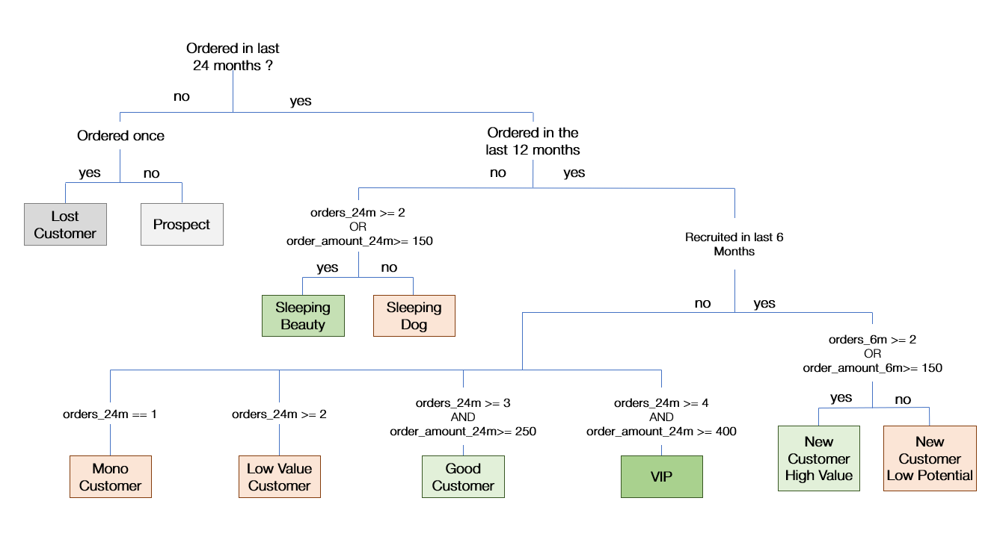

In [10]:
Image(filename='RFM.png', width=750, height=750)

##### 2D Scatterplots

We plot a each combination of our RFM class to see if each combination properly splits our class labels meaning
- Recency / Frequency
- Recency / Monetary
- Frequency / Monetary

We remove VIP before charting, to better see differences between other categories

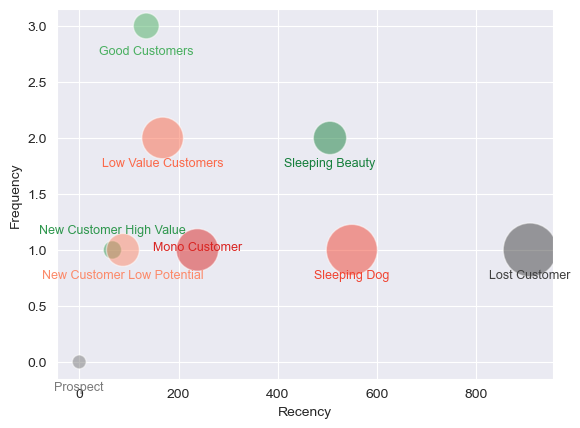

In [11]:
# Create new dataframe without index 'VIP'
df_recencyfrequency = df_grouped.drop(index='VIP')

# Get color from dictionary defined before
colors = [class_colors[idx] for idx in df_recencyfrequency.index]

# Plot scatter plot with size as number of records
scatter = sns.scatterplot(
    data=df_recencyfrequency,
    x=df_recencyfrequency[('days_since_last_order', 'mean')],
    y=df_recencyfrequency[('orders_24m', 'mean')],
    size=df_recencyfrequency['num_records'],
    sizes=(100, 1500),
    alpha=0.5,
    c=colors,
    legend=False
)

# Add text labels to the center of each bubble
# text in same color as bubble
for line in range(df_recencyfrequency.shape[0]):
    label = df_recencyfrequency.index[line]
    x = df_recencyfrequency[('days_since_last_order', 'mean')][line]
    # Small adjustment to vertical position to better read labels
    if label == 'New Customer High Value':
        y = 1.15
    elif label == 'Mono Customer':
        y = 1
    else:
        y = df_recencyfrequency[('orders_24m', 'mean')][line]-0.25
    color = class_colors[label]
    scatter.text(x, y, label, 
                  horizontalalignment='center',
                  size=9,
                  color=color)  # set label color based on customer class

plt.xlabel('Recency')
plt.ylabel('Frequency')

plt.show()

A lot of classes have the same average frequency due to definition, but recency is correlated to better classes (new customer high value have better recency than Low potential for instance).

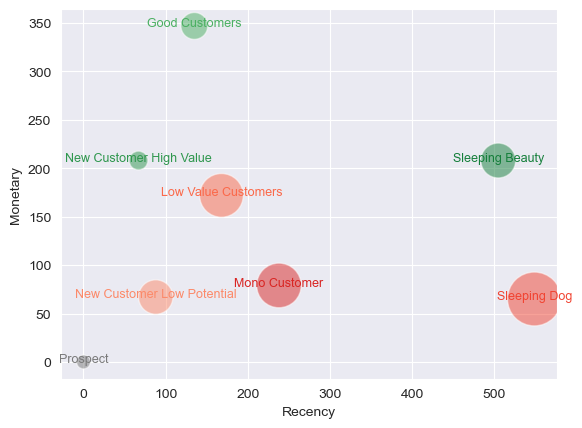

In [12]:
# Create new dataframe without index 'VIP'
df_recencymonetary = df_grouped.drop(index=['VIP','Lost Customer'])

# Get color from dictionary defined before
colors = [class_colors[idx] for idx in df_recencymonetary.index]

# Plot scatter plot with size as number of records
scatter = sns.scatterplot(
    data=df_recencymonetary,
    x=df_recencymonetary[('days_since_last_order', 'mean')],
    y=df_recencymonetary[('order_amount_24m', 'mean')],
    size=df_recencymonetary['num_records'],
    sizes=(100, 1500),
    alpha=0.5,
    c=colors,  # set bubble color based on customer class
    legend=False
)

# Add text labels to the center of each bubble
# text in same color as bubble
for line in range(df_recencymonetary.shape[0]):
    label = df_recencymonetary.index[line]
    x = df_recencymonetary[('days_since_last_order', 'mean')][line]
    y = df_recencymonetary[('order_amount_24m', 'mean')][line]-0.25
    color = class_colors[label]
    scatter.text(x, y, label, 
                  horizontalalignment='center',
                  size=9,
                  color=color)  # set label color based on customer class

plt.xlabel('Recency')
plt.ylabel('Monetary')

plt.show()

We see the same thing as in table for monetary, the Good Customers and Sleeping beauty are above their threshold by a good margin.

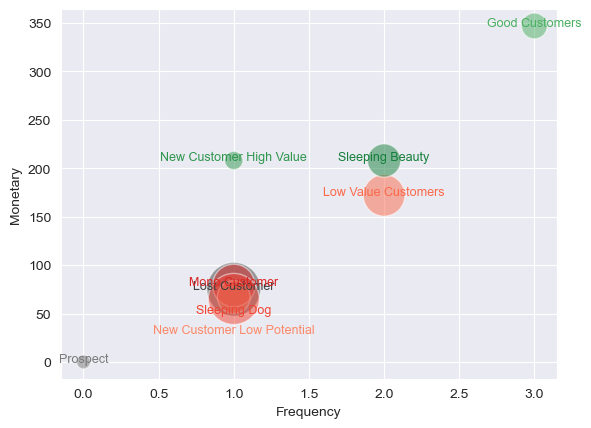

In [13]:
# Create new dataframe without index 'VIP'
df_frequencymonetary = df_grouped.drop(index=['VIP'])

# Get color from dictionary defined before
colors = [class_colors[idx] for idx in df_frequencymonetary.index]

# Plot scatter plot with size as number of records
scatter = sns.scatterplot(
    data=df_frequencymonetary,
    x=df_frequencymonetary[('orders_24m', 'mean')],
    y=df_frequencymonetary[('order_amount_24m', 'mean')],
    size=df_frequencymonetary['num_records'],
    sizes=(100, 1500),
    alpha=0.5,
    c=colors,
    legend=False
)

# Add text labels to the center of each bubble
# text in same color as bubble
for line in range(df_frequencymonetary.shape[0]):
    label = df_frequencymonetary.index[line]
    x = df_frequencymonetary[('orders_24m', 'mean')][line]
    # Small adjustment to vertical position to better read labels
    if label == 'New Customer Low Potential':
        y = 30
    elif label == 'Sleeping Dog':
        y = 50
    else:
        y = df_frequencymonetary[('order_amount_24m', 'mean')][line]
    color = class_colors[label]
    scatter.text(x, y, label, 
                  horizontalalignment='center',
                  size=9,
                  color=color)  # set label color based on customer class

plt.xlabel('Frequency')
plt.ylabel('Monetary')

plt.show()

Again, here frequency stacks a lot of classes. 

##### 3D Scatterplots
We know plot the same in 3D, a bit for fun to be honest and to see if bubbles are well separated in 3D

First we plot all classes

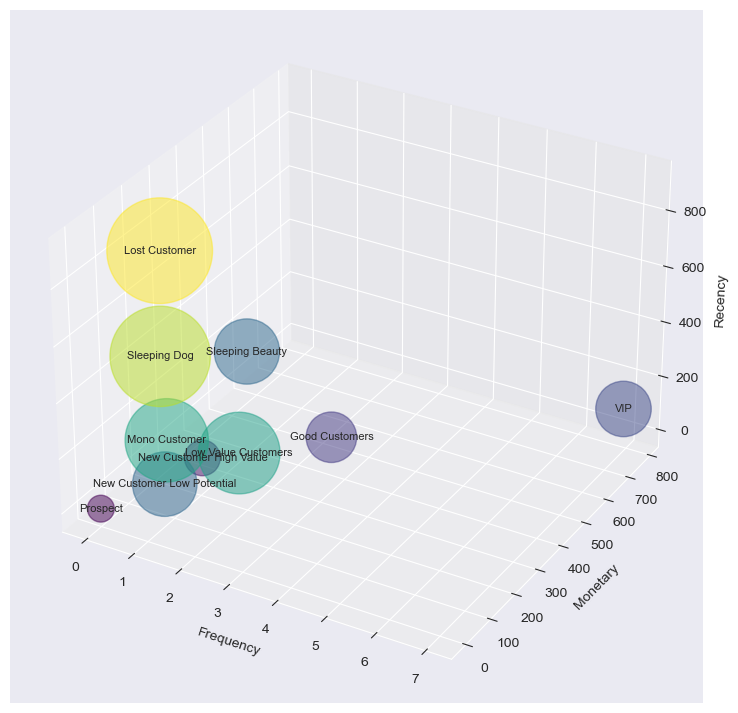

In [14]:
# Create a 3D axes object
fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(111, projection='3d')

# Define data used in scatter
x = df_grouped[('orders_24m', 'mean')]
y = df_grouped[('order_amount_24m', 'mean')]
z = df_grouped[('days_since_last_order', 'mean')]
size = df_grouped['num_records'] / 10
c = size

# Plot 3D scatter plot with size as number of records
scatter = ax.scatter(x, y, z, s=size, c=c, alpha=0.5, cmap='viridis')

# Add text labels to center of each bubble
for line in range(df_grouped.shape[0]):
    label = df_grouped.index[line]
    x_pos = x[line]
    y_pos = y[line]
    z_pos = z[line]
    ax.text(x_pos, y_pos, z_pos, label,
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=8)

ax.set_xlabel('Frequency')
ax.set_ylabel('Monetary')
ax.set_zlabel('Recency')

plt.show()

We exclude Lost Customer, VIP to be able to better visualize differences between other classes.

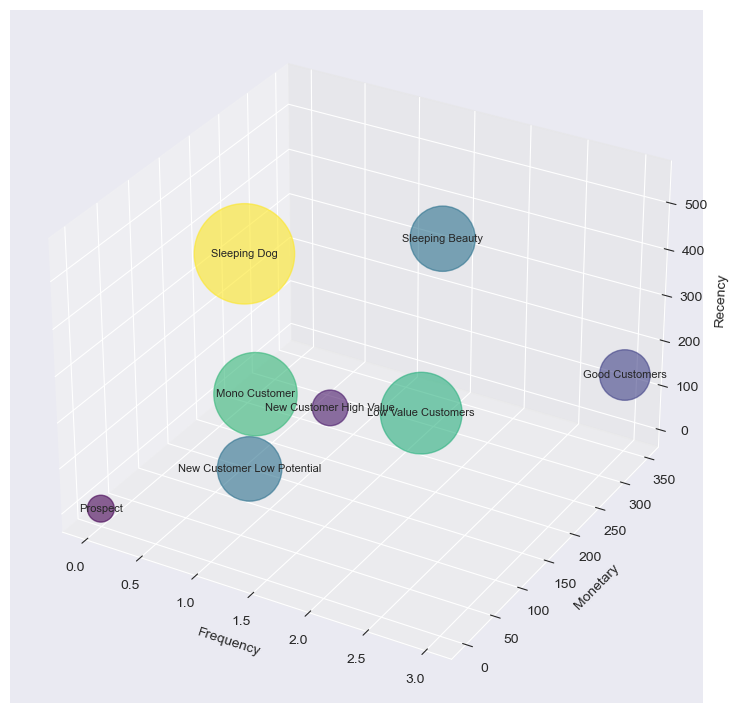

In [15]:
df_grouped = df_grouped.drop(index=['VIP','Lost Customer'])

# Create a 3D axes object
fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(111, projection='3d')

# Define data used in scatter
x = df_grouped[('orders_24m', 'mean')]
y = df_grouped[('order_amount_24m', 'mean')]
z = df_grouped[('days_since_last_order', 'mean')]
size = df_grouped['num_records'] / 10
c = size

# Plot 3D scatter plot with size as number of records
scatter = ax.scatter(x, y, z, s=size, c=c, alpha=0.6, cmap='viridis')

# Add text labels to center of each bubble
for line in range(df_grouped.shape[0]):
    label = df_grouped.index[line]
    x_pos = x[line]
    y_pos = y[line]
    z_pos = z[line]
    color = scatter.to_rgba(size[line])
    ax.text(x_pos, y_pos, z_pos, label,
            horizontalalignment='center',
            verticalalignment='center',
            fontsize=8)

ax.set_xlabel('Frequency')
ax.set_ylabel('Monetary')
ax.set_zlabel('Recency')

plt.show()

Looks good ! Classes are well differentiated and we have no overlap.

##### Distribution of rfm_labels

Here, we investigate split of rfm_labels one year after, or else said, the values of target_label_12M for each rfm_labels.

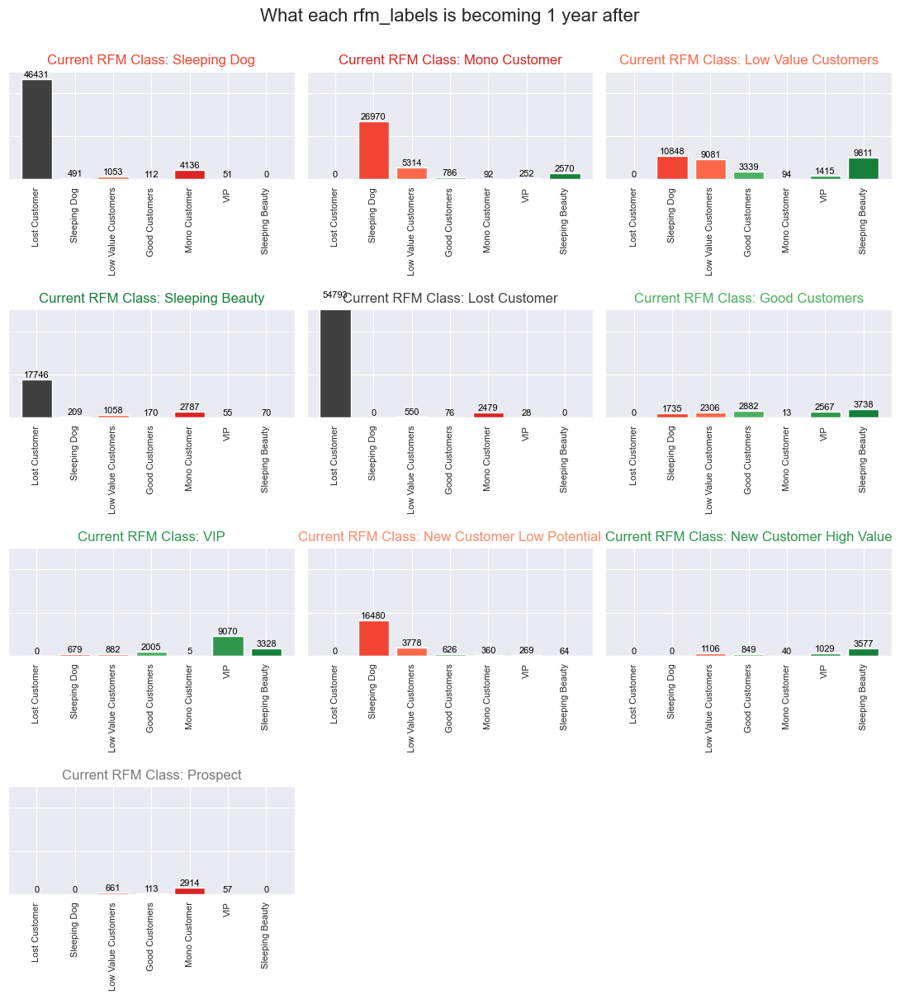

In [16]:
# Get a list of unique RFM labels and target labels
rfm_labels = df['rfm_labels'].unique()
target_labels = df['target_label_12M'].unique()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(11, 12))
fig.suptitle('What each rfm_labels is becoming 1 year after',
             fontsize=16,
             y=1.005             
            )
axes = axes.flatten()
fig.subplots_adjust(hspace=0.5)

# Loop over each RFM label
for i, rfm_label in enumerate(rfm_labels):

    rfm_df = df[df['rfm_labels'] == rfm_label]
    
    # Count number of records for each target label
    counts = [len(rfm_df[rfm_df['target_label_12M'] == t]) for t in target_labels]
    colors = [class_colors[t] for t in target_labels]  
    bars = axes[i].bar(target_labels, counts, color=colors)
    
    title = f"Current RFM Class: {rfm_label}"

    axes[i].set_title(title, color=class_colors[rfm_label])
    axes[i].tick_params(axis='x', labelrotation=90, labelsize=8)
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        axes[i].text(bar.get_x() + bar.get_width() / 2, height, count, ha='center', va='bottom', color='black', fontsize=8)

for ax in axes:
    ax.set_ylim([0, 50000])
    ax.tick_params(axis='y', which='both', labelleft=False, labelright=False)
    if not ax.has_data():
        ax.remove()
    
plt.tight_layout()
plt.show()

What we can visually see is that for some classes a dummy predictor that would predict only one class would be hard to beat.
- Lost Customer, Sleeping Dog and Sleeping Beauty classes become Lost Customer. For instance, predicting Lost Customer to Lost Customer shows a 94% accuracy.
- Mono Customer and New Customer Low Potential become Sleeping Dog

We display on heatmap below exact % of such a predictor
- Would be Sleeping Dog 89%
- Sleeping Beauty 81%
- Prospect 77%

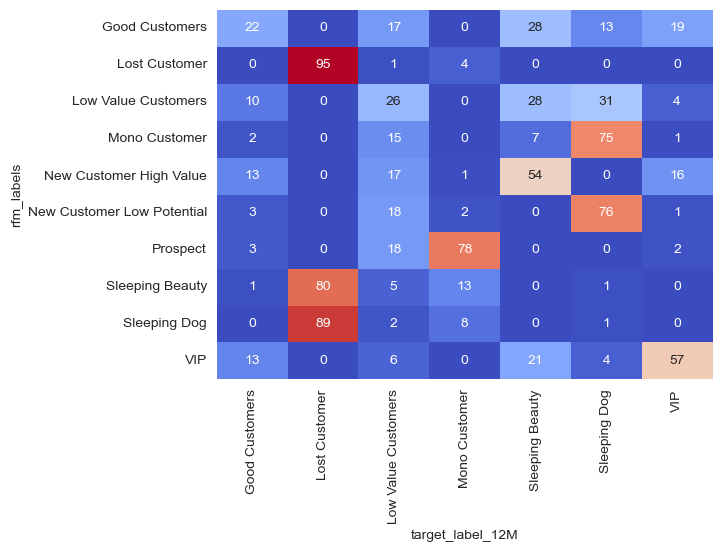

In [17]:
heatmap_data = df.groupby(['rfm_labels', 'target_label_12M']).size().unstack(fill_value=0)
heatmap_data = heatmap_data.div(heatmap_data.sum(axis=1), axis=0) * 100

sns.heatmap(heatmap_data, cmap='coolwarm', annot=True, fmt='.0f', cbar=False)
plt.show()

This Heatmap highlights that most interesting classes for further analysis where predictor would find value are 
- Good Customers / Low Value Customers where dummy predictor would be around 30% accuracy
- VIP in a lesser extent, but increasing retention on higher value customers is one keep concept in CRM. Even increasing prediction accuracy by 10-20% could have positive impact on marketing activities.

Inverting relationships does not provide a clear insight, but is reassuring in the sense that all target classes are fed from different classes.

We see that predicting future classes of VIP / Good Customers / Low Value Customers is predicting 89% of next year VIPs.

##### Different target labels 

We have predicted target label in intervals of 3 / 6 / 9 / 12 months. We compare how much rfm_labels evolve on these intervals

In [18]:
# Group by rfm_labels
grouped_data = df.groupby('rfm_labels')

# Calculate percentage of equal values to rfm_labels for each column
result = pd.DataFrame()
for col in ['target_label_3M', 'target_label_6M', 'target_label_9M', 'target_label_12M']:
    col_name = col + '_equal_pct'
    result[col_name] = grouped_data.apply(lambda x: (x[col] == x['rfm_labels']).sum() / len(x) * 100)

result

,target_label_3M_equal_pct,target_label_6M_equal_pct,target_label_9M_equal_pct,target_label_12M_equal_pct
rfm_labels,,,,
Good Customers,61.913753,41.160033,29.408655,21.765728
Lost Customer,97.883507,96.414391,95.316438,94.591375
Low Value Customers,70.108130,48.276859,34.179484,26.254770
Mono Customer,55.360716,17.524455,7.189306,0.255669
New Customer High Value,38.888047,0.000000,0.000000,0.000000
New Customer Low Potential,44.649395,0.000000,0.000000,0.000000
Prospect,61.388518,34.899866,15.540721,0.000000
Sleeping Beauty,64.267934,35.442408,13.876443,0.316814
Sleeping Dog,71.561388,46.110877,23.497341,0.939281


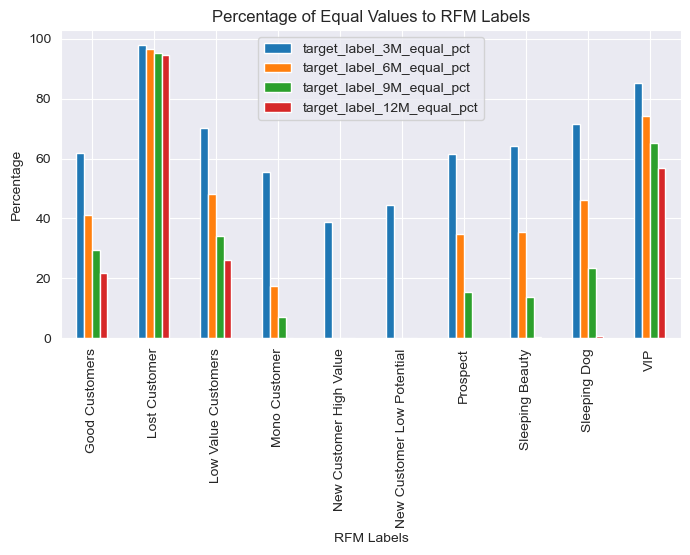

In [19]:
# Plot a vertical bar chart
result.plot(kind='bar', figsize=(8, 4))
plt.title('Percentage of Equal Values to RFM Labels')
plt.xlabel('RFM Labels')
plt.ylabel('Percentage')
plt.show()

- On some classes like Lost Customer or VIP, there is low variation between predicting a label three months or one year after. 
- But for Good Customers and Low Value Customers it more than doubles variation of rfm_labels. 
- And obviously, on classes that are defined by recruitment in past 6 months, both New Customers classes, it make them vanish

That is why we chose to continue in studying target_label_12M to capture as much variation as possible, as extending prediction range proves valuable in increasing variation in target_label

#### ii) Sample
A small sample of the entries, features, values

All features try to represent the state of consumer at a date, `generation_date`. They are essentially there to represent level of information at the time.

In [20]:
df.shape

(264000, 96)

In [21]:
pd.options.display.max_columns = None
df.sample(5)

,customer_id,acquisition_date,language,gender,recruitment_source,zip_code,birthdate,email_domain,email_domain_type,total_orders,orders_15d,orders_1m,orders_3m,orders_6m,orders_12m,orders_18m,orders_24m,order_amount_15d,order_amount_1m,order_amount_3m,order_amount_6m,order_amount_12m,order_amount_18m,order_amount_24m,total_orders_amount,first_order_date,last_order_date,last_online_order_date,last_offline_order_date,generation_month,generation_date,days_until_first_order,days_since_acquisition,days_since_last_order,rfm_labels,purchase_channel,promo_rate,top_category,top_subcategory,top_franchise,top_item,category_diversity,subcategory_diversity,franchise_diversity,item_diversity,first_order_cat_diversity,first_order_subcat_diversity,first_order_total_amount_before_discount,first_order_total_amount,first_order_total_quantity,first_order_channel,second_order_cat_diversity,second_order_subcat_diversity,second_order_total_amount_before_discount,second_order_total_amount,second_order_total_quantity,second_order_channel,second_order_date,third_order_cat_diversity,third_order_subcat_diversity,third_order_total_amount_before_discount,third_order_total_amount,third_order_total_quantity,third_order_channel,third_order_date,first_order_promo_rate,second_order_promo_rate,third_order_promo_rate,second_order_amount_shift,third_order_amount_shift,second_order_quantity_shift,third_order_quantity_shift,second_order_days_since_last_order,third_purchase_days_since_last_order,order_amount_mean,order_amount_std,order_time_mode,order_weekday_mean,order_promo_rate,sum_opened_email,sum_clicked_email,preferred_device_open,preferred_device_click,target_label_3M,prediction_date_3M,target_label_6M,prediction_date_6M,target_label_9M,prediction_date_9M,target_label_12M,prediction_date_12M,days_since_first_order,days_since_second_order,days_since_third_order,days_since_last_online_order,days_since_last_offline_order
261871,Om4hxXgq3HQokmfGpkU6olG6YSxu95e12MWm98zI0lA=,2006-12-23,de,M,Offline,NaN,NaT,other,international_domain,22.0,NaN,NaN,NaN,1.0,1.0,2.0,2.0,NaN,NaN,NaN,12.32,12.32,157.36,157.36,1204.60,2013-08-31,2020-08-15,NaN,2020-08-15,12,2020-12-12,2443 days,5103 days,119.0,Low Value Customers,offline,0.818182,Hair,Hair,Franchise_PCIxkiD5WZxYzoFBmJNLO1VabcM+L0qhG27b...,2ER4vkjV15rTknbCSrZJhgddyxYcQZhKAWAZlAVxtWQ=,0.048387,0.129032,0.306452,0.516129,0.666667,0.666667,67.76,67.76,4.0,offline,0.25,0.25,63.28,63.28,4.0,offline,2013-12-18,1.000000,1.000000,16.24,16.24,1.0,offline,2014-07-12,1.0,1.0,1.0,-4.48,-47.04,0.0,-3.0,109.0,206.0,55.314545,37.889050,6-12,4.863636,0.725359,NaN,NaN,NaN,NaN,Low Value Customers,2021-03-12,Low Value Customers,2021-06-10,Low Value Customers,2021-09-08,Low Value Customers,2021-12-07,2660.0,2551.0,2345.0,NaN,119.0
121097,z2443aGqk2gFdNM0+7Z3xLWogj/+kd+3tht3ID/AGMA=,2015-05-30,fr,F,Offline,1206,NaT,gmail.com,international_domain,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77.28,2015-05-30,2018-03-07,NaN,2018-03-07,6,2020-06-15,0 days,1843 days,831.0,Lost Customer,offline,NaN,Hair,Hair,Franchise_yNit44C3gXeB0FGsZL4pbT3YyIr20umsZ4L6...,Fv57/dZNs0II/urYX94yQUG9asAp17xmnjHUKDdmSUw=,0.500000,0.500000,1.000000,1.000000,0.500000,0.500000,51.84,51.84,2.0,offline,0.50,0.50,25.44,25.44,2.0,offline,2018-03-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,-26.40,NaN,0.0,NaN,1012.0,NaN,38.640000,18.667619,6-12,3.500000,1.000000,28.0,0.0,iPhone,NaN,Lost Customer,2020-09-13,Lost Customer,2020-12-12,Lost Customer,2021-03-12,Lost Customer,2021-06-10,1843.0,831.0,NaN,NaN,831.0
87773,MbgKFm9IEG2dwE0c83NBJhwlB/2MH6XdQdJHV847h4Q=,2008-02-22,de,F,Offline,8008,1971-09-09,hotmail.com,international_domain,3.0,NaN,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,NaN,NaN,120.00,120.00,120.00,242.96,2016-05-07,2020-06-03,NaN,2020-06-03,4,2021-04-11,2997 days,4797 days,312.0,Mono Customer,offline,NaN,Hair,Hair,Franchise_yGUWDs8NZGK8qIBVJHjU0SQHHCLxClrmQDSI...,nVFNRDGPq6nVeB0/0M38r3y0zecGS+l8XfQedOn422Q=,0.400000,0.400000,0.400000,0.800000,1.000000,1.000000,38.32,38

#### iv) Information captured

The sample is obtained as a snapshot of the database at a specific date `generation_date`. The work is done by custom function in the dataset creation notebook, mainly using a functon called Function called `generate_backdated_contacts`. For each date, we include only customers that were acquired before that date. It then merges various dataframes to get relevant statistics on customer behavior, including orders, RFM scores, purchase behavior, item diversity, purchase path, customer order statistics, and email statistics.

We display first few columns as rows for better visibility and display entries for VIP only as they possess most complete information. We will anyway investigate missing values, and missing value by rfm_label later on.

##### Contact information

The first 9 rows are directly related to contact information. They include straigthforward information about where and when contact was recruited and some non-identifiable personal information (as opposed to First Name and Last Name) such as email_domain and zip_code.

In [22]:
pd.options.display.max_rows = None

# Filter for rows where rfm_labels == 'VIP'
vip_row = df.loc[df['rfm_labels'] == 'VIP'].sample(n=5, random_state=1)

vip_row.T.head(9)

,121391,152616,202085,155617,224652
customer_id,LDUjRLLknUDX8moIEkcYIza+t8lFjFNZusSq3Syagwo=,zYHr5ee3Z3/jATlK4OVGHJ6QsmzeJ227OOmwNQ+nCjY=,6MkPRsTIvXwjkQZ+eC5RUEVNwwcIapSIF9rYL8y5emY=,aSh8H5liMySdetaxatTA8gkVTHHJBdYM5FoG1y8MBiQ=,yXePqXsLVWxquUbDcggTBqwq0ThAmPGN9gTidoJCa5w=
acquisition_date,2019-05-27,2016-11-08,2019-06-08,2015-02-27,2020-04-09
language,de,de,de,de,fr
gender,U,F,U,F,F
recruitment_source,Website,Offline,Offline,Offline,Website
zip_code,1110,8953,1202,8600,1255
birthdate,NaT,NaT,1980-07-27,1900-02-05,1985-02-01
email_domain,gmail.com,bluewin.ch,hotmail.com,hotmail.com,gmail.com
email_domain_type,international_domain,swiss_domain,international_domain,international_domain,international_domain


##### Orders snapshot

The part following is added information on orders up to generation_date
- `orders_15d` for instance is orders in last 15days and `order_amount_15d`	is corresponding amount in CHF.
- `days_since_acquisition` or `days_since_last_order` are calculated also dynamically based on generation_date

`rfm_labels` is calculated based on  those metrics recalculated at generation date 
> detailed in part 'RFM segmentation' of _dataset_creation.ipynb_

In [23]:
vip_row.T.head(35)

,121391,152616,202085,155617,224652
customer_id,LDUjRLLknUDX8moIEkcYIza+t8lFjFNZusSq3Syagwo=,zYHr5ee3Z3/jATlK4OVGHJ6QsmzeJ227OOmwNQ+nCjY=,6MkPRsTIvXwjkQZ+eC5RUEVNwwcIapSIF9rYL8y5emY=,aSh8H5liMySdetaxatTA8gkVTHHJBdYM5FoG1y8MBiQ=,yXePqXsLVWxquUbDcggTBqwq0ThAmPGN9gTidoJCa5w=
acquisition_date,2019-05-27,2016-11-08,2019-06-08,2015-02-27,2020-04-09
language,de,de,de,de,fr
gender,U,F,U,F,F
recruitment_source,Website,Offline,Offline,Offline,Website
zip_code,1110,8953,1202,8600,1255
birthdate,NaT,NaT,1980-07-27,1900-02-05,1985-02-01
email_domain,gmail.com,bluewin.ch,hotmail.com,hotmail.com,gmail.com
email_domain_type,international_domain,swiss_domain,international_domain,international_domain,international_domain
total_orders,6.0,17.0,11.0,21.0,4.0


##### Feature ideas

Following rows after `rfm_labels` correspond to various added information about purchase behavior at time of purchase. The idea in generating thos features was to be able in EDA to explore if some of them are indicators of future behavior. Examples of what might be indicative of future behavior
- Buying on promotion all the time
- Buying on promotion right from the first purchases
- Buying various types of products
- Buying a specific category of products and later expanding to other products ranges
- Always buying the same amount 
- Buying more and more or less or with eratic purchase amounts
- Buying only online or offline or omnichannel

How to read
- `_promo_rate` are 1 if nothing was bought on sale. For later in datacleaning, we might have promo rates be 0 if nothing was bought on sale which would make more sense and restrict values between 0-1, there might be some werid values we want to correct.
- `_diversity` are 1 if everything is different in order. For example, `franchise_diversity` is 1 if customer bought three products and they are all in different franchises

In [24]:
vip_row.T.head(83)

,121391,152616,202085,155617,224652
customer_id,LDUjRLLknUDX8moIEkcYIza+t8lFjFNZusSq3Syagwo=,zYHr5ee3Z3/jATlK4OVGHJ6QsmzeJ227OOmwNQ+nCjY=,6MkPRsTIvXwjkQZ+eC5RUEVNwwcIapSIF9rYL8y5emY=,aSh8H5liMySdetaxatTA8gkVTHHJBdYM5FoG1y8MBiQ=,yXePqXsLVWxquUbDcggTBqwq0ThAmPGN9gTidoJCa5w=
acquisition_date,2019-05-27,2016-11-08,2019-06-08,2015-02-27,2020-04-09
language,de,de,de,de,fr
gender,U,F,U,F,F
recruitment_source,Website,Offline,Offline,Offline,Website
zip_code,1110,8953,1202,8600,1255
birthdate,NaT,NaT,1980-07-27,1900-02-05,1985-02-01
email_domain,gmail.com,bluewin.ch,hotmail.com,hotmail.com,gmail.com
email_domain_type,international_domain,swiss_domain,international_domain,international_domain,international_domain
total_orders,6.0,17.0,11.0,21.0,4.0


##### Target_labels


The last 13 rows are composed on predictions labels at different months indents. After 3 months, 6 months, 9 months, 12 months. We might only keep target_label_12M as it is the one showing most changes as expected. It has the advantages being a good match with the division based on months in our classes, where classes are based on orders either on 6 months, 12 months or 24 months.

Finally, five days delta where added. I have added them in last step of dataset creation while thinking a good way to deduplicate data would be to replace dates by days delta as for instance
- for each `generation_date`, `first_order_date` is the same for a customer
- BUT `days_since_first_order` is different for each `generation_date`

In [25]:
vip_row.T.tail(13)

,121391,152616,202085,155617,224652
target_label_3M,VIP,VIP,VIP,VIP,VIP
prediction_date_3M,2021-09-08,2020-10-13,2021-01-11,2021-11-07,2022-02-05
target_label_6M,VIP,VIP,VIP,VIP,Sleeping Beauty
prediction_date_6M,2021-12-07,2021-01-11,2021-04-11,2022-02-05,2022-05-06
target_label_9M,VIP,VIP,VIP,VIP,Sleeping Beauty
prediction_date_9M,2022-03-07,2021-04-11,2021-07-10,2022-05-06,2022-08-04
target_label_12M,Good Customers,VIP,Sleeping Beauty,VIP,Sleeping Dog
prediction_date_12M,2022-06-05,2021-07-10,2021-10-08,2022-08-04,2022-11-02
days_since_first_order,745.0,1345.0,493.0,2355.0,523.0
days_since_second_order,729.0,1331.0,444.0,2340.0,453.0


#### v) Encoding of the features

Most of dataframe is made of numerical columns which will not require encoding, but still pre-processing techniques such as normalization, handling missing values, and removing outliers will be important to ensure that the data is suitable for machine learning. Here we look at non numerical columns

In [26]:
list(df.select_dtypes(exclude=['number']).columns)

['customer_id',
 'acquisition_date',
 'language',
 'gender',
 'recruitment_source',
 'zip_code',
 'birthdate',
 'email_domain',
 'email_domain_type',
 'first_order_date',
 'last_order_date',
 'last_online_order_date',
 'last_offline_order_date',
 'generation_date',
 'rfm_labels',
 'purchase_channel',
 'top_category',
 'top_subcategory',
 'top_franchise',
 'top_item',
 'first_order_channel',
 'second_order_channel',
 'second_order_date',
 'third_order_channel',
 'third_order_date',
 'order_time_mode',
 'preferred_device_open',
 'preferred_device_click',
 'target_label_3M',
 'prediction_date_3M',
 'target_label_6M',
 'prediction_date_6M',
 'target_label_9M',
 'prediction_date_9M',
 'target_label_12M',
 'prediction_date_12M']

##### Zip Code
One idea for feature encoding is to change the zip_code to a indicator that can be used in conjonction with publicly available statistics, such as [by commune statistics](https://www.bfs.admin.ch/bfs/en/home/statistics/catalogues-databases/tables.assetdetail.15864461.html). This could be a way to inquire whether there is a link between customer class and living in a low or high density area.

##### Replacing date columns by days intervals
As part of encoding, we want to drop columns that are dates and are already present as days intervals. We remove calculate `age` based on `birthdate` first.

In [27]:
def calculate_age_column(df):
    """
    This function calculates age based on the values in 'generation_date' and 'birthdate'
    """
    df = df.copy()  
    # Check that 'birthdate' is not NA before calculating age
    mask = df['birthdate'].notna()
    df.loc[mask, 'age'] = (pd.to_datetime(df['generation_date']) - pd.to_datetime(df['birthdate'])) / pd.Timedelta(days=365)
    return df

In [28]:
df = calculate_age_column(df)

In [29]:
def drop_date_columns(df):
    """
    This function drops dates columns that are already present as days intervals.
    """
    columns_to_drop = [
        'acquisition_date',
        'birthdate',
        'first_order_date',
        'last_order_date',
        'last_online_order_date',
        'last_offline_order_date',
        'second_order_date',
        'third_order_date'
    ]
    return df.drop(columns_to_drop, axis=1)

In [30]:
df = drop_date_columns(df)

##### Dropping unused prediction columns

We have generated multiple target label to see how customer class evolve in 3/6/9/12 months. As to simplify problem at hand, we at the moment will keep only customer class in 12 months and propose how to predict it, restricting our problem to a multiclass classification problem

In [31]:
def drop_prediction_columns(df):
    """
    This function drops unused target labels and prediction dates columns
    These columns are not needed for encoding or analysis.
    """
    columns_to_drop = [
        'target_label_3M',
        'prediction_date_3M',
        'target_label_6M',
        'prediction_date_6M',
        'target_label_9M',
        'prediction_date_9M',
        'prediction_date_12M'
    ]
    return df.drop(columns_to_drop, axis=1)

In [32]:
df = drop_prediction_columns(df)

In the upcoming section, following the examination of granularity, we intend to remove from dataframe `customer_id` and `generation_date`. The rationale behind this decision is that the customer ID is not useful as it stays the same across database snapshots. While in fact, the same customer ID one month afterwards in our case does not translate to the same data point.

Instead, what could matters for feature engineering is the customer's status during the `generation_month`. We choose to keep generation_month as a potentially relevant time feature in order to capture seasonal trends within the cosmetics industry, rather than `generation_date`. Days are to granular a measurement to be used, and years would include yearly seasonality and this can not be useful in prediction. This is also why we chose to start looking at database snapshots after COVID stores reopening, not to include in training data 'abnormal' database snapshots that have no offline purchases for a good year. `Generation_month` will enable us to incorporate the month of prediction in our feature predictions.

#### vi) Data granularity

##### Data types

Most data types are float as expected, there is some change to do :
- on timedelta to harmonize them to float with other `days_` variable.
- on generation month, to convert it to an object as this column is potentially susceptible to one hot encoding, considering there is no ordinality between months.

In [33]:
def convert_timedelta_columns_to_float(df):
    """
    Convert timedelta64 columns to float columns representing the number of days.
    """
    df = df.copy()  
    df['days_until_first_order'] = df['days_until_first_order'].dt.total_seconds() / 86400.0
    df['days_since_acquisition'] = df['days_since_acquisition'].dt.total_seconds() / 86400.0
    return df

In [34]:
df = convert_timedelta_columns_to_float(df)

In [35]:
def convert_month_to_str(df):
    """
    Change values of generation_month from 1,2,3.. to Jan, Feb, Mar
    """
    df = df.copy()  
    df['generation_month'] = df['generation_month'].apply(lambda x: pd.Timestamp(year=2000, month=x, day=1).strftime('%b'))
    return df

In [36]:
df = convert_month_to_str(df)

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264000 entries, 0 to 263999
Data columns (total 82 columns):
 #   Column                                     Non-Null Count   Dtype  
---  ------                                     --------------   -----  
 0   customer_id                                264000 non-null  object 
 1   language                                   264000 non-null  object 
 2   gender                                     264000 non-null  object 
 3   recruitment_source                         264000 non-null  object 
 4   zip_code                                   223758 non-null  object 
 5   email_domain                               264000 non-null  object 
 6   email_domain_type                          264000 non-null  object 
 7   total_orders                               260255 non-null  float64
 8   orders_15d                                 8777 non-null    float64
 9   orders_1m                                  16395 non-null   float64
 10  orders_3

##### Statistical summaries

In [38]:
np.round(df.describe().loc[["mean", "min", "max"], :].T, 0)

,mean,min,max
total_orders,4.0,1.0,209.0
orders_15d,1.0,1.0,4.0
orders_1m,1.0,1.0,6.0
orders_3m,1.0,1.0,9.0
orders_6m,1.0,1.0,15.0
orders_12m,2.0,1.0,27.0
orders_18m,2.0,1.0,36.0
orders_24m,2.0,1.0,46.0
order_amount_15d,90.0,7.0,925.0
order_amount_1m,93.0,7.0,925.0


##### Unique values

First we look at in average how many times the same `customer_id` is used in different `generation_month`

In [39]:
count_df = df.groupby('customer_id').size().reset_index(name='count')

# average time for each customer_id
avg_count = count_df['count'].mean()

print(f"Each customer_id appears on average {avg_count:.2f} times in df.")

Each customer_id appears on average 5.08 times in df.


This seems to be an appropriate amount as we generated more than 2 years of monthly databases snapshots.

Next, we look at unique values for object variables.

In [40]:
df.select_dtypes(include='object').dropna().apply(pd.Series.unique)

customer_id               [GN660S9ljy1Okde6cifc8lWRyy85lrwO6U7Uasb6zY4=,...
language                                                       [fr, de, it]
gender                                                            [F, M, U]
recruitment_source                           [Offline, Website, Media, nan]
zip_code                  [1228, 8606, 8840, 5000, 3098, 8032, 8852, 800...
email_domain              [gmail.com, yahoo.com, bluewin.ch, hotmail.com...
email_domain_type         [international_domain, swiss_domain, frdeit_do...
generation_month          [Jan, Feb, Mar, Apr, May, Jun, Jul, Aug, Sep, ...
generation_date           [2022-01-06, 2021-01-11, 2021-02-10, 2022-02-0...
rfm_labels                [Good Customers, Low Value Customers, VIP, Los...
purchase_channel                            [offline, multichannel, online]
top_category                                     [Skin Care, Hair, Hygiene]
top_subcategory           [Face Care, Hair, Face Cleansing, Men Skin Car...
top_franchis

What we can infer from the list of unique values is that 
- Some email domains might be useless and will generate too much columns using one hot encoding. EDA can further inform if
    - whether emain domain is useful for classification
    - select a subset of domains that are usefull
- Same can be said other object columns as `top_subcategory`, `recruitment_source`
- `top_franchise` and `top_item` are contain both probably too many values to be useful in this state.

As discussed before, we drop at this point 

In [41]:
def drop_duplicated_columns(df):
    """
    This function drops customer_id and generation_date
    """
    columns_to_drop = [
        'customer_id',
        'generation_date'
    ]
    return df.drop(columns_to_drop, axis=1)

In [42]:
df = drop_duplicated_columns(df)

#### vii) Data quality
> Missing, incorrect values, data completeness

First, we plot for each `rfm_labels` the amount of data completeness

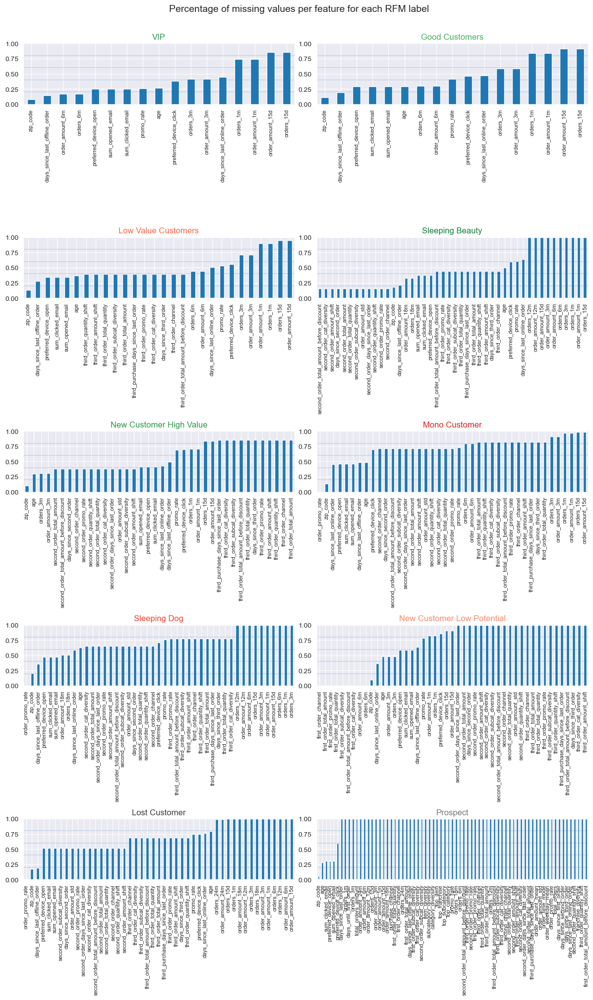

In [43]:
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(12, 20))
axes = axes.flatten()

# Get percentage of missing values for each rfm_label
# goal is to plot first rfm_label with less missing values
missing_value_percentage = {}
for rfm_label in df['rfm_labels'].unique():
    filtered_df = df[df['rfm_labels'] == rfm_label]
    missing_value_percentage[rfm_label] = filtered_df.isna().mean().mean()

# Sort rfm_labels based on percentage of missing values
sorted_rfm_labels = sorted(df['rfm_labels'].unique(), key=lambda x: missing_value_percentage[x])

for i, rfm_label in enumerate(sorted_rfm_labels):
    filtered_df = df[df['rfm_labels'] == rfm_label]

    filtered_df_missing_values_count = filtered_df.isna().mean().sort_values()
    filtered_df_missing_value = filtered_df_missing_values_count[filtered_df_missing_values_count > 0].sort_values(ascending=True)
    
    # Plot percentage of missing values for current rfm_label
    filtered_df_missing_value.plot(
        kind='bar',
        ax=axes[i],
        ylim=(0, 1),
        grid=True
    )
    
    axes[i].set_title(rfm_label, color=class_colors[rfm_label])
    axes[i].tick_params(axis='x', labelsize=8)

    # Add horizontal gridlines
    for j in range(1, 5):
        axes[i].axhline(y=j/5, linewidth=0.2)

fig.suptitle('Percentage of missing values per feature for each RFM label', fontsize=14, y=1.005)
plt.tight_layout()
plt.show()

By examining the plots, we can identify discrepancies between the amount of missing data for different `rfm_labels`. These discrepancies may suggest that we should consider fitting our machine learning model only on a subset of the `rfm_labels` with a relatively low amount of missing data, such as "Good Customer" and "VIP" in this case.

By doing so, we may be able to improve the accuracy and generalization of our model, as it might perform on only first on a subset of `rfm_labels` that share same characteristics.

#### viii) Specific insights
> If you are using data close to your domain of expertise, please give us some insight into the use of the features

There is no specific feature that requires additional explanation, RFM has been explained earlier and other features are very straigthforward like age, email domain and float variables on order amounts and counts.

One specific comment on difference between 
- `recruitment_source` which takes values [Website, Offline, Media]
- `purchase_channel` which takes values  [online, multichannel, offline]

Purchase channel can evolve from online to multichannel, or from offline to multichannel. Recruitment source stays always the same by definition and is not necessarily linked to a purchase, meaning
- Recruited on __Website__ does not mean you purchased on Website. Multiple either recurring recruitment operations take place on a Website, ranging from "newsletter subscribtion" box form that is on most website to specific sampling or contest operations on Website.
- Recruited __Offline__ is not necessarily linked to purchase, you can also partake in some specific offline animations, for instance you could have a contest where participants can win something for Mother's Day.
- Recruited on __Media__ englobes multiple Media Platform : Affiliation partnerships, Facebook, Google, TikTok, Pinterest .... The detailed is not specified here to keep confidentiality of recruitment sources.



### (b) Plan to manage and process the data

#### i) Data management
> Managing your data ex. storing, file formats, database usage

I intend to generate my train/valid/test from dataset creation notebook and load it here using pickle format.

#### ii) Data cleaning

##### Promo rates

We talked about earlier about standardizing promo rates from 0 to 1, as there might be sometimes cases where promo rate is greater than 1 which makes no sense as this would mean amount before discount is lower than after discount.

In [44]:
def reformat_promo_rates(df):
    '''
    This function cleans potential errors in promo rate where it would mean
    that order amount was higher after discount.
    Drops unused columns at the end.
    '''
    # Replace any metric with promo rate in name by 0 if under 0 or by 1 if above 1
    promo_cols = [col for col in df.columns if 'promo_rate' in col and col != 'promo_rate']
    for col in promo_cols:
        df[col] = np.where(df[col] < 0, 0, np.where(df[col] > 1, 1, df[col]))
        # Change value of metric with promo rate in name to 1-promo rate
        # Meaning a promo rate of 0 sign
        df[col] = 1 - df[col]
        
    # Compare values where order amount before discount are lower than order amount
    df['first_order_total_amount_before_discount'] = np.where(
        (df['first_order_total_amount_before_discount'].notna()) & 
        (df['first_order_total_amount'].notna()) & 
        (df['first_order_total_amount_before_discount'] < df['first_order_total_amount']),
        df['first_order_total_amount'], df['first_order_total_amount_before_discount'])
    
    # Second order
    df['second_order_total_amount_before_discount'] = np.where(
        (df['second_order_total_amount_before_discount'].notna()) & 
        (df['second_order_total_amount'].notna()) & 
        (df['second_order_total_amount_before_discount'] < df['second_order_total_amount']),
        df['second_order_total_amount'], df['second_order_total_amount_before_discount'])
    
        # Second order
    df['third_order_total_amount_before_discount'] = np.where(
        (df['third_order_total_amount_before_discount'].notna()) & 
        (df['third_order_total_amount'].notna()) & 
        (df['third_order_total_amount_before_discount'] < df['third_order_total_amount']),
        df['third_order_total_amount'], df['third_order_total_amount_before_discount'])

    # Drop all columns that have 'before_discount' in their name
    before_discount_cols = [col for col in df.columns if 'before_discount' in col]
    df = df.drop(columns=before_discount_cols)
    
    # More explicit naming for promo columns
    df = df.rename(columns={'promo_rate': 'orders_with_promo_rate', 'order_promo_rate': 'average_order_promo_rate'})
    
    return df

In [45]:
df = reformat_promo_rates(df)

##### Age

In [46]:
def replace_age(df):
    '''
    Replace unrealistic values of age
    '''
    # Replace age values greater than 90 or lower than 16
    age_mask = (df['age'] > 90) | (df['age'] < 16)
    df.loc[age_mask, 'age'] = np.nan
    
    return df

In [47]:
df = replace_age(df)

##### Gender and recruitment_source

Here we replace unrealistic 'nan' values of `gender` and `recruitment_source` by their most common values.

In [48]:
df['gender'].value_counts()

F      197807
M       38938
U       26636
nan       619
Name: gender, dtype: int64

In [49]:
df['recruitment_source'].value_counts()

Offline    170817
Website     84180
Media        8971
nan            32
Name: recruitment_source, dtype: int64

In [50]:
def replace_gender_and_recruitment_source(df):
    '''
    Replace unknow Gender by F, as most customers are 
    '''
    # Replace 'nan' and 'U' values in 'gender' column with 'F'
    df['gender'] = df['gender'].replace(['nan', 'U'], 'F')
    
    # Replace 'nan' values in 'recruitment_source' by 'Offline'
    df['recruitment_source'] = df['recruitment_source'].replace('nan', 'Offline')
    
    return df

In [51]:
df = replace_gender_and_recruitment_source(df)

##### Opening, clicking devices

Here we replace 'nan', 'unknown', 'proxy', 'Other' values of `preferred_device_open` and `preferred_device_click`. We take most frequent values for device for each email domain and rfm_labels combo (we do this after we have seen in descriptive statistics as rfm_labels get different email domains, and different email_domains intuitively correlate to different devices)

In [52]:
def replace_preferred_devices(df):
    '''
    Replace 'nan', 'unknown', 'proxy' string values in preferred_device_open and preferred_device_click columns
    with most frequent value for each column in same email domain.
    '''
    # Replace 'nan' string values with NaN values
    df.replace('nan', np.nan, inplace=True)
    df[['preferred_device_open', 'preferred_device_click']] = df[['preferred_device_open', 'preferred_device_click']].replace(['proxy', 'unknown','Other'], np.nan)

    grouped = df.groupby(['email_domain', 'rfm_labels'])

    # Replace NaN values with the mode for each column in each group
    df['preferred_device_open'] = grouped['preferred_device_open'].apply(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else 'iPhone'))
    df['preferred_device_click'] = grouped['preferred_device_click'].apply(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else 'iPhone'))
    
    # Replacing Ipod
    df[['preferred_device_open', 'preferred_device_click']] = df[['preferred_device_open', 'preferred_device_click']].replace(['iPod'], 'iPhone')

    return df

In [53]:
df = replace_preferred_devices(df)

#### iii) Feature engineering

##### Existing 

A lot of feature engineering happened already at the stage of dataset creation. This part is repeated from dataset creation notebook
- Function `get_purchase_behavior()` calculates 
    * promo_rate by dividing number of orders with a promo by the total number of orders for each customer. 
    * purchase_channel either "online", "offline", and "multichannel" (purchased both offline and online)
- Function `get_item_diversity()`  groups the orders by customer ID and aggregates the number of unique categories, subcategories, franchises, and items purchased by each customer. It also calculates the average number of unique categories, subcategories, franchises, and items per order for each customer.
- Function `get_purchase_path()` calculates metrics such as item diversity (how varied where items in each purchase), total amount spent, and channel used for each customer's first, second, and third orders. It also calculates metrics related to promotional rates, purchase shifts (CHF increase or decrease from first to second order ?), and days since the last order (how many days between first and second order)
- Function `get_customer_order_stats()` selects a subset of columns to keep non-duplicated values of CustomerID and OrderID to remove duplicated line by item_id. Calculates
    - Mean and standard deviation of order amounts
    - Mode of order time (in 4 quartiles 0-6, 6-12, 12-18, 18-24) to know if a customer is most accustomed to ordering in the afternoon or in the evening for instance 
    - Mean of order weekday. Is it a pattern to order more at the start of the week (chore like task) or during week end (maybe more discovery shopping). 
    - Order promo rate, ratio of the order amount after discounts to the order amount before discounts.
- Function `get_email_stats()` determines
    - preferred device for opening and clicking emails for each customer based on the sum of emails opening/clicks.
    - Overall number of email clicks and opens.

##### Further Ideas
As discussed previously, some ideas remained left for feature engineering
- From zip code the population density of dwelling.
- Engineering customer profile from gender, language and type of dwelling. Example of 30-45 Swiss German Lady Living in Zurich.
- From email opening and clicking behavior, profiles of interaction. One example could be Mobile_reader_Desktop_clicker if most emails are opened on mobile and most emails are clicked from PC, intuition would be it indicates will to stay up to date with brands, but click on the email only when potentially interested to purchase (as we often see greater e-commerce conversion rates on desktop that mobile)
- Product category preferences and diversity rates (meaning how many different item types were bought accross orders), we could also engineer new feature such as Skincare_monomaniac
- Profiles based on the time shifts, value shifts between the first three purchases 

#### iv) Combining datasets
> How do you plan to combine the datasets

I don't plan to further combine another dataset to the dataset obtained from dataset creation notebook. You can see the detailed way I combined three different databases obtained from three different SQL queries into one in the notebook.

#### v) Datasets compatibility
> Compatibility of the different datasets: encodings, standards, units, etc.

Everything is compatible and in the same currency (CHF)

#### vi) Features extractions
> The features you will select from each dataset

Introduction of part __iii) Feature engineering__ explains how we extracted from mainly an orders database multiple features and added them at contact level. The same was done for extracting email interaction features combining an email interactions database and the contact database.

Overall, the goal of features extraction was to have everything on at contact level, as our data points are contact for which we are trying to predict future class.

## 3) Exploratory data analysis (EDA)

### (a) Preliminary EDA

#### i) Descriptive statistics
Provide descriptive statistics and informative plots on your features

##### Numerical columns

Here we avoid replotting the same plots based on RFM dimensions, days_since_last_order, orders_24m and order_amount_24m.

In [54]:
def plot_stripplot_by_rfm_label(df, numerical_columns):
    """
    Creates a stripplot for each numerical column in 'numerical_columns'
    Plots stripplots using all 'rfm_labels' as categories on x-axis
    """
    # Unique values of rfm_labels ordered by mean of first numerical column
    # We keep same order for all suplots for readability
    unique_labels = df.groupby('rfm_labels')[numerical_columns[0]].mean().sort_values().index

    # Two striplots horizontally to improve readability 
    num_cols = 4
    num_rows = len(numerical_columns) // num_cols
    if len(numerical_columns) % num_cols != 0:
        num_rows += 1
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 4*num_rows), tight_layout=True)
    axes = axes.ravel()

    for i, column in enumerate(numerical_columns):

        sns.stripplot(x='rfm_labels',
                      y=column,
                      data=df,
                      ax=axes[i],
                      order=unique_labels,
                      palette=class_colors,
                      alpha=0.5,
                      s=1)

        # Clean formatting
        axes[i].set_title(column, fontsize=12)
        axes[i].set_xlabel('')
        axes[i].set_xticklabels(unique_labels, rotation=90, fontsize=8)
        axes[i].set_ylabel('')

    fig.suptitle(f'Striplots of numerical columns by RFM Label', fontsize=14, y=1.005)

    for ax in axes.flatten():
        if not ax.has_data():
            ax.remove()
    plt.show()

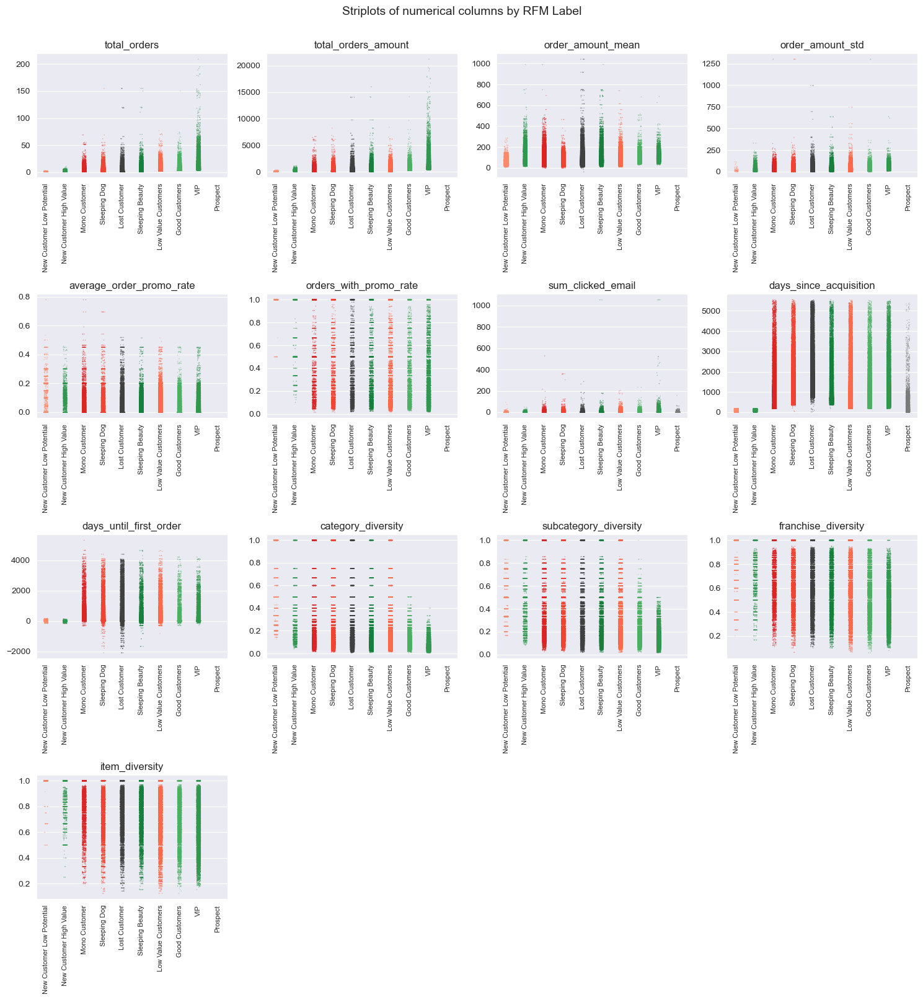

In [55]:
columns_to_striplot = ['total_orders',
                       'total_orders_amount',
                       'order_amount_mean',
                       'order_amount_std',
                       'average_order_promo_rate',                       
                       'orders_with_promo_rate',
                       'sum_clicked_email',
                       'days_since_acquisition',
                       'days_until_first_order',
                       'category_diversity',
                       'subcategory_diversity',
                       'franchise_diversity',
                       'item_diversity',
                      ]
plot_stripplot_by_rfm_label(df, columns_to_striplot)

We can see from stripplots
- total orders and total orders amount differentiate between rfm_labels as expected

Otherwise, the following are not differentiating enough
- Avg order value or order standard deviation. Better client classes do not necessarily order more on average.
- Order promo rates are not higher for one class. It seems VIP get better at purchasing in promo, which would make sense as the better accustomed to a brand, the better you can plan.
- Days since acquisition or days until first order do not seem useful.
- Diversity measures do not seem useful.
- Email clicks do not seem not useful.

##### Order timings

We investigate if there is any specific preferred time and day for purchasing, and if the behavior is different accross client types

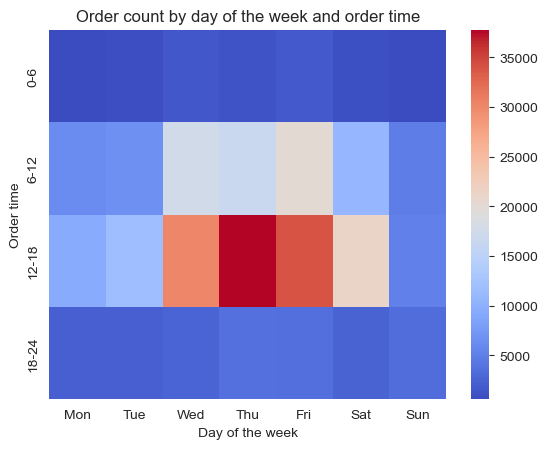

In [56]:
# Restrict to purchaser
df_purchasers = df.loc[df['rfm_labels'] != 'Prospect'].copy()

# Round 'order_weekday_mean' column to an integer
df_purchasers.loc[:, 'order_weekday_mean'] = df_purchasers['order_weekday_mean'].round().astype(int)

# Map tables for hours and days
order_hours = ['0-6', '6-12', '12-18', '18-24']
order_days = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

# Order order_time
df_purchasers.loc[:, 'order_time_mode'] = df_purchasers['order_time_mode'].map(lambda x: order_hours.index(x))

# Count of orders by time and day
order_time_and_day_table = df_purchasers.pivot_table(index='order_time_mode', columns='order_weekday_mean', aggfunc='size', fill_value=0)

sns.heatmap(order_time_and_day_table,
            yticklabels=order_hours,
            xticklabels=order_days,
            cmap='coolwarm'
           )

plt.xlabel('Day of the week')
plt.ylabel('Order time')
plt.title('Order count by day of the week and order time');

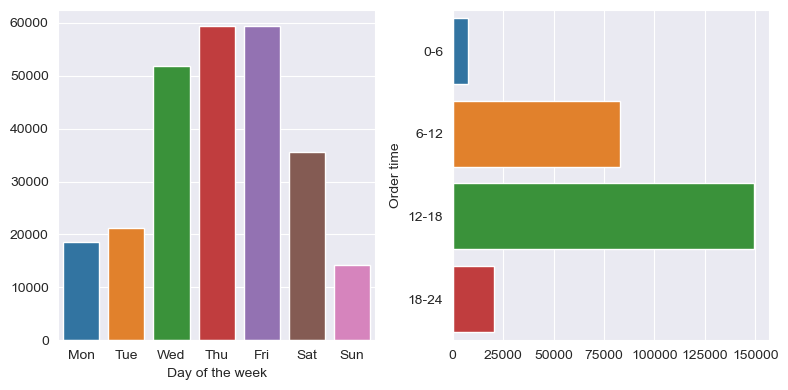

In [57]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))

# Vertical bar chart for days
order_day_totals = order_time_and_day_table.sum(axis=0)
sns.barplot(x=order_days, y=order_day_totals, ax=ax1)
ax1.set_xlabel('Day of the week')

# Vertical bar chart for order time
order_time_totals = order_time_and_day_table.sum(axis=1)
sns.barplot(x=order_time_totals, y=order_hours, ax=ax2)
ax2.set_ylabel('Order time')

plt.tight_layout()
plt.show()

It is interesting to see that most orders happen during the week and during working hours, which seems to be counter intuitive.

Now, we iterate through rfm_labels and look at the heatmap for specific customer class

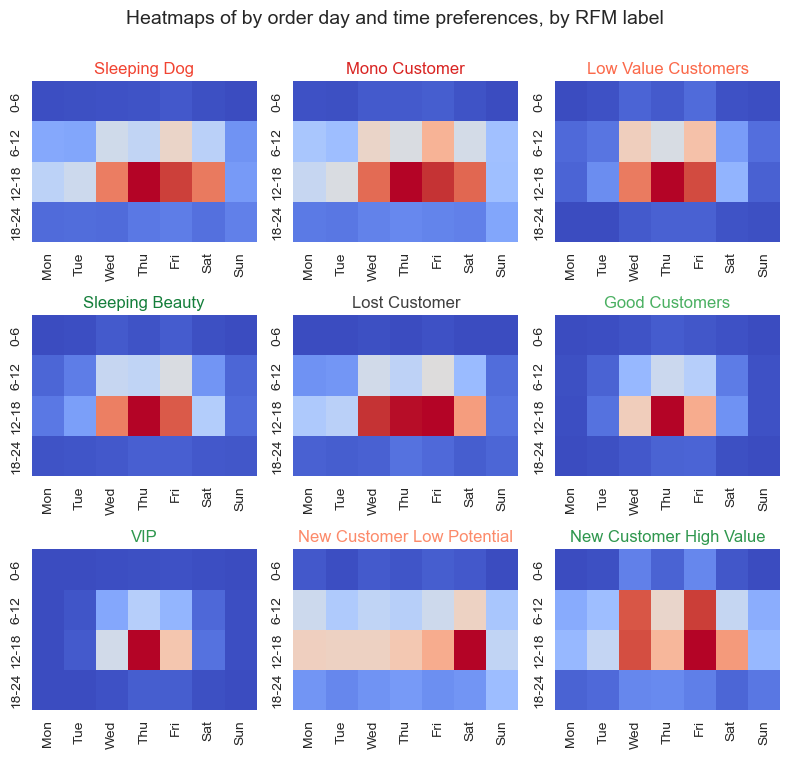

In [58]:
df_purchasers = df.loc[df['rfm_labels'] != 'Prospect'].copy()

df_purchasers.loc[:, 'order_weekday_mean'] = df_purchasers['order_weekday_mean'].round().astype(int)
df_purchasers.loc[:, 'order_time_mode'] = df_purchasers['order_time_mode'].map(lambda x: order_hours.index(x))

rfm_labels = df_purchasers['rfm_labels'].unique()

# Set figure so that we have 3 subplots horizontally
num_plots = len(rfm_labels)
num_cols = 3
num_rows = int(np.ceil(num_plots / num_cols))
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(8, num_rows*2.5))
axes = axes.flatten()

for i, rfm_label in enumerate(rfm_labels):
    df_label = df_purchasers.loc[df_purchasers['rfm_labels'] == rfm_label].copy()

    # Count of orders by time and day
    order_time_and_day_table = df_label.pivot_table(index='order_time_mode', columns='order_weekday_mean', aggfunc='size', fill_value=0)

    sns.heatmap(order_time_and_day_table,
                yticklabels=order_hours,
                xticklabels=order_days,
                cmap='coolwarm',
                ax=axes[i],
                cbar=False
               )

    # Remove axis + colored suplot title
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].set_title(rfm_label, color=class_colors[rfm_label])

fig.suptitle('Heatmaps of by order day and time preferences, by RFM label', fontsize=14, y=1.005)
plt.tight_layout()
plt.show()

It is cool to see that VIP and Good Customers are focusing their purchases on Thursdays afternoon. I would not have expected days of purchase and hours to specific to one class.

##### Socio-demo

First for readability, we define a new column called age_group, which group values of age based on intelligible brackets (used regularly in business).

In [59]:
def categorize_age(df):
    '''
    Create age groups based on current values of age
    '''
    age_bins = [0, 25, 35, 45, 55, 65, np.inf]
    age_labels = ['0-25', '25-35', '35-45', '45-55', '55-65', '65+']
    df['age_group'] = pd.cut(df['age'], bins=age_bins, labels=age_labels)
    return df

In [60]:
df = categorize_age(df)

We plot heatmaps to identify is there to visually identify any patterns or differences in the relationship between age, gender, language, and the number of records per rfm_labels. For instance, are males better represented on some class ?

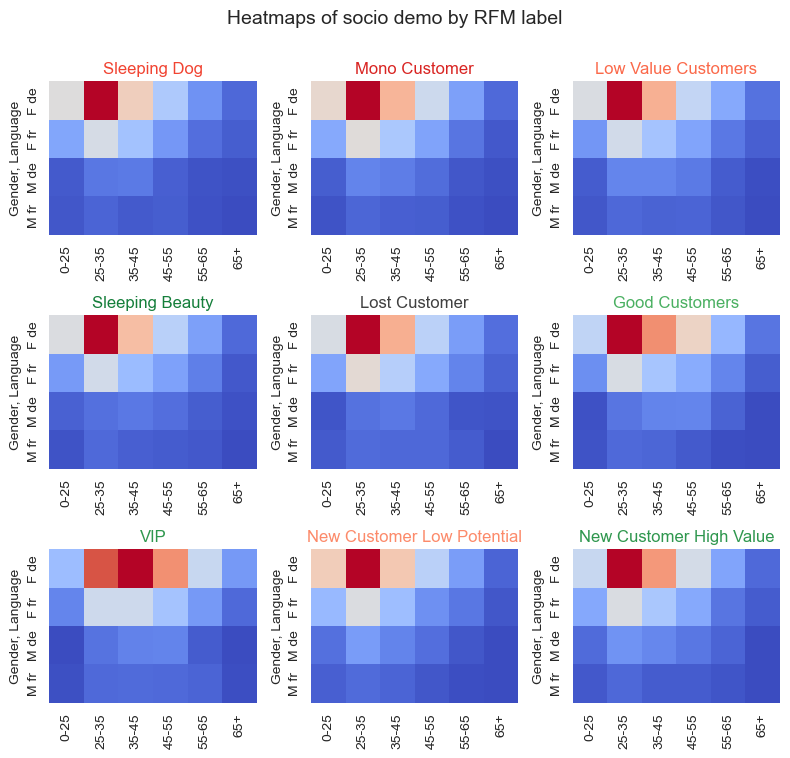

In [61]:
df_defr = df.loc[(df['language'] != 'it') & (df['rfm_labels'] != 'Prospect')].copy()
df_defr['gender_language'] = df_defr['gender'] + ' ' + df_defr['language']

# Set figure so that we have 3 subplots horizontally
num_plots = len(rfm_labels)
num_cols = 3
num_rows = int(np.ceil(num_plots / num_cols))
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(8, num_rows*2.5))
axes = axes.flatten()

for i, rfm_label in enumerate(df_defr['rfm_labels'].unique()):
    # Filter data for current rfm_label
    df_label = df_defr[df_defr['rfm_labels'] == rfm_label]
    
    # Count of records by gender_language and age group
    sociodemo_table = df_label.pivot_table(index='gender_language', columns='age_group', aggfunc='size', dropna=True)
    
    sns.heatmap(sociodemo_table,
                cmap='coolwarm',
                ax=axes[i],
                cbar=False
               )
    
    axes[i].set_title(rfm_label, color=class_colors[rfm_label])
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Gender, Language')

fig.suptitle('Heatmaps of socio demo by RFM label', fontsize=14, y=1.005)
plt.tight_layout()
plt.show()

This does not very explicitly segment customers, we have higher presence of French and 35-45 on VIPs. We will now plot histograms categorical column by categorical column to further investigate. 

In [62]:
def plot_histograms_by_category(df, categorical_column):
    '''
    Plot one histogram as subplot for each rfm_label with distribution on categorical_column
    Also adds on right axis and in light grey the overall distribution to see discrepancies
    '''
    # Filter df to exclude 'Prospect' rfm_label
    df = df[(df['rfm_labels'] != 'Prospect') & (df[categorical_column].notna())].copy()
    
    # Overall distribution of the categorical column
    # used to compare with specific rfm_label and identify discrepancies
    overall_counts = df[categorical_column].value_counts()
    # Number of bins equal to unique values in categorical column
    bins = np.arange(len(df[categorical_column].unique())+1)-0.5
 
    # List of unique rfm_labels, sorted by mean of 'total_orders_amount'
    # we do this to increase readibility 
    unique_labels = df.groupby('rfm_labels')['total_orders_amount'].mean().sort_values(ascending=False).index   

    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(9, 7), tight_layout=True)
    axes = axes.ravel()

    for i, rfm_label in enumerate(unique_labels):
        data = df[df['rfm_labels'] == rfm_label][categorical_column]

        axes[i].hist(data, bins=bins)
        axes[i].set_title(rfm_label, color=class_colors[rfm_label])
        axes[i].set_xticks(df[categorical_column].unique())
        axes[i].set_xticklabels(df[categorical_column].unique(), rotation=90, fontdict={'fontsize': 8, 'horizontalalignment': 'center'})

        # Add overall distribution on right axis, and in grey
        ax2 = axes[i].twinx()
        ax2.hist(overall_counts.index, weights=overall_counts.values, alpha=0.4, color='gray',bins=bins)
        ax2.tick_params(axis='y', right=False, labelright=False)        
        ax2.grid(False)

    fig.suptitle(f'Ditribution of {categorical_column} by RFM Label versus Overall distribution', fontsize=14, y=1.005)
    plt.show() 

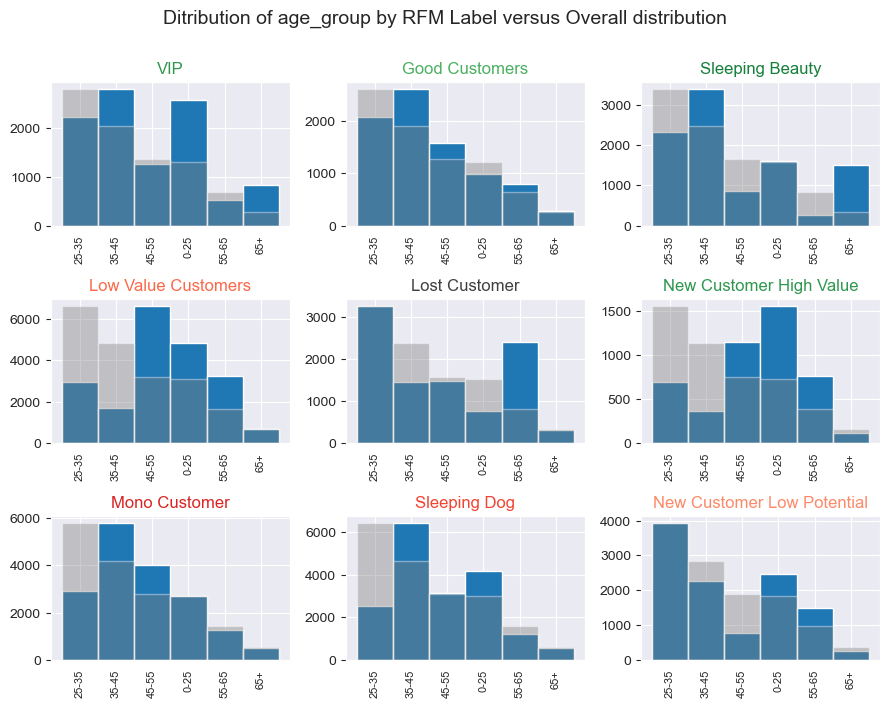

In [63]:
plot_histograms_by_category(df, 'age_group')

The `age_group` indicates that 
- VIP are over represented in 50-65+ age range
- Good customers are both over represent on 45-55 and 0-25. It is interesting to see widely different distribution between Good customer and VIP
- Sleeping Beauty distribution is closed to Good Customers
- Over representation of 65+ does not indicate positive group, as shows distribution of New Customer Low Potential, so we can not say the older the better, meaning there does not seem to ordinality

Overall the different distributions accross age_group indicate that it is a valuable feature to differentiate between rfm_label. In further analysis, it would be interesting for each rfm_label chosen in a subset to analyze whether we see the same distribution for a given label for target_label_12M.

##### Item Categories

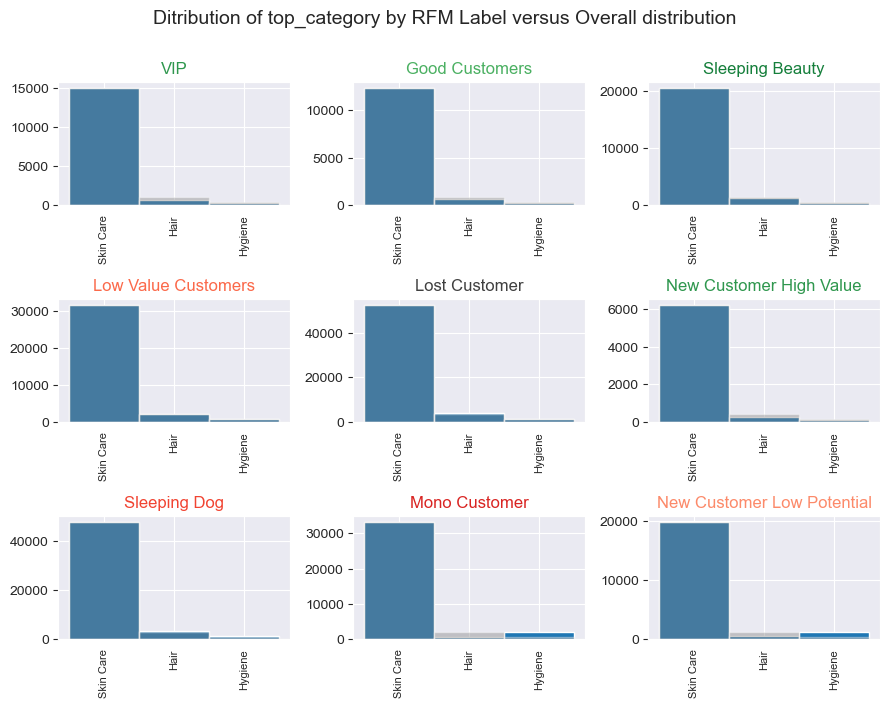

In [64]:
plot_histograms_by_category(df, 'top_category')

`top_category` is useless in differentiating rfm_labels and we suggest dropping it later.

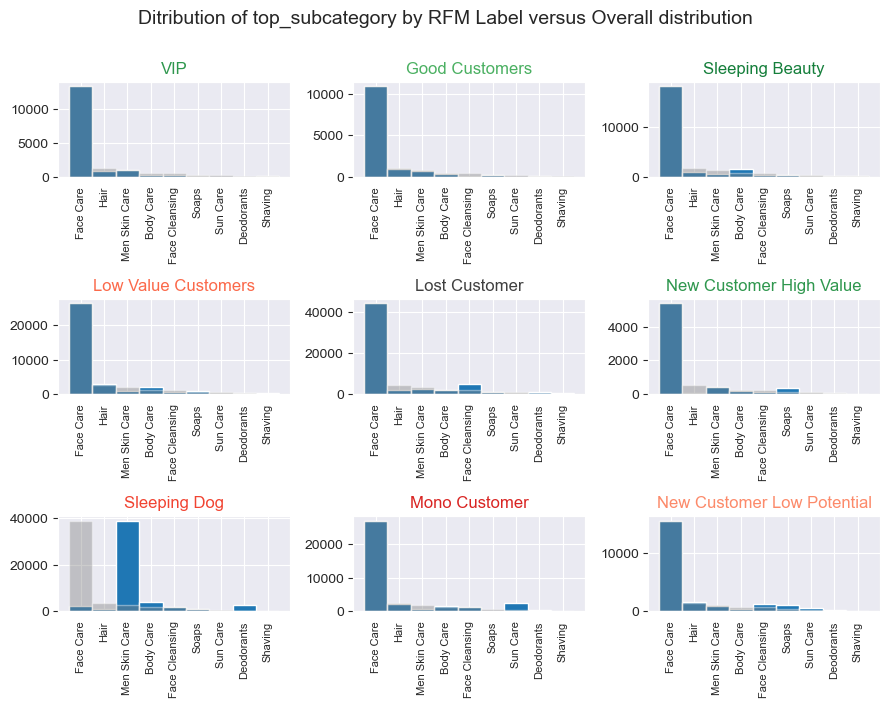

In [65]:
plot_histograms_by_category(df, 'top_subcategory')

`top_subcategory` is less useless, but indicates we could define boolean dimensions in our dataset_creation, such as 'bought_facecleansing' as it appears face cleansing is more represented as a top category on VIP. It is also funny to see how much Hair subcategory is over represented as a top_subcategory. One additional thing to looks further into is for chosen categories for analysis if the top_subcategory changes with `target_label_12m`

##### Email Domains

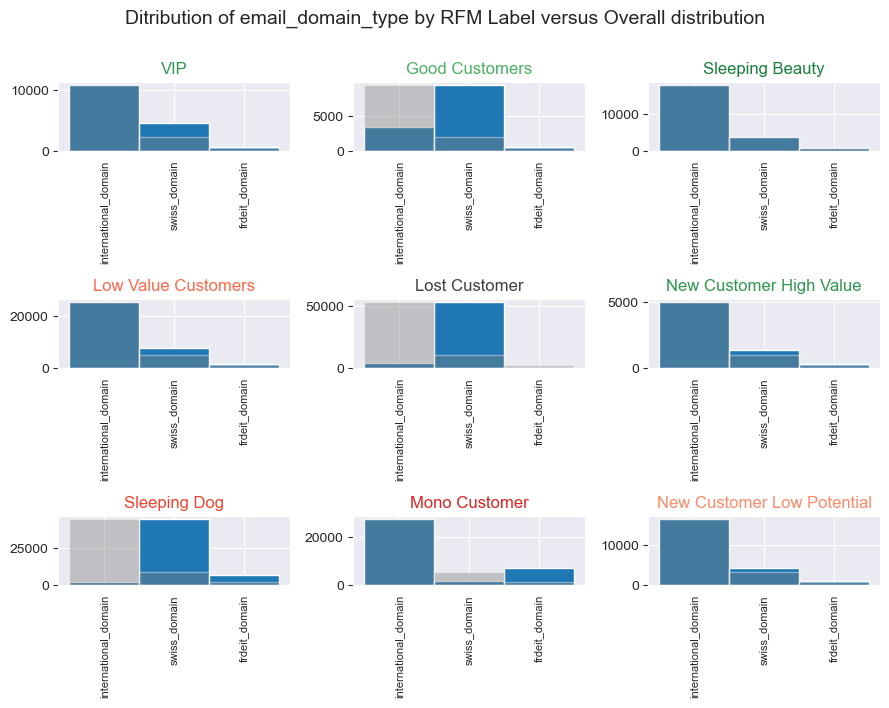

In [66]:
plot_histograms_by_category(df, 'email_domain_type')

I was not excepting swiss_domains to be this over represented on Good Customers, as this was more a shot in the dark than anything else. French/German/Italian email domains are overrepresented on Sleeping Dog and MonoCustomers which could be expected

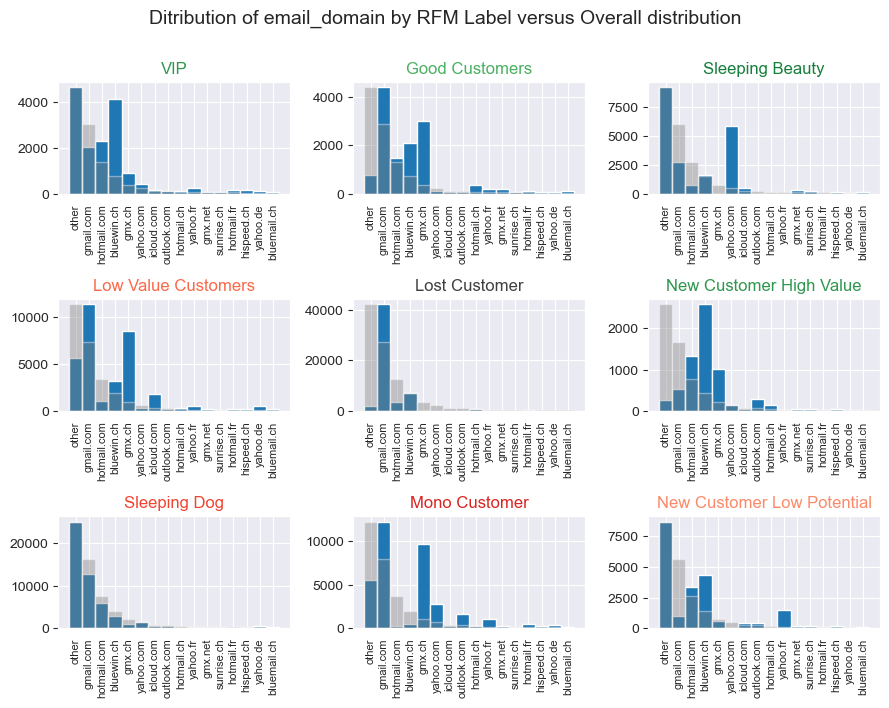

In [67]:
plot_histograms_by_category(df, 'email_domain')

This again is a surprise. It seems yahoo.com is over represnented on some customers classes but no clear if good or bad as both VIP and Mono Customers share this trait. It would be interesting in further analysis for a specific rfm_label to see if different emails domains correlates to `target_label_12m` values

##### Devices

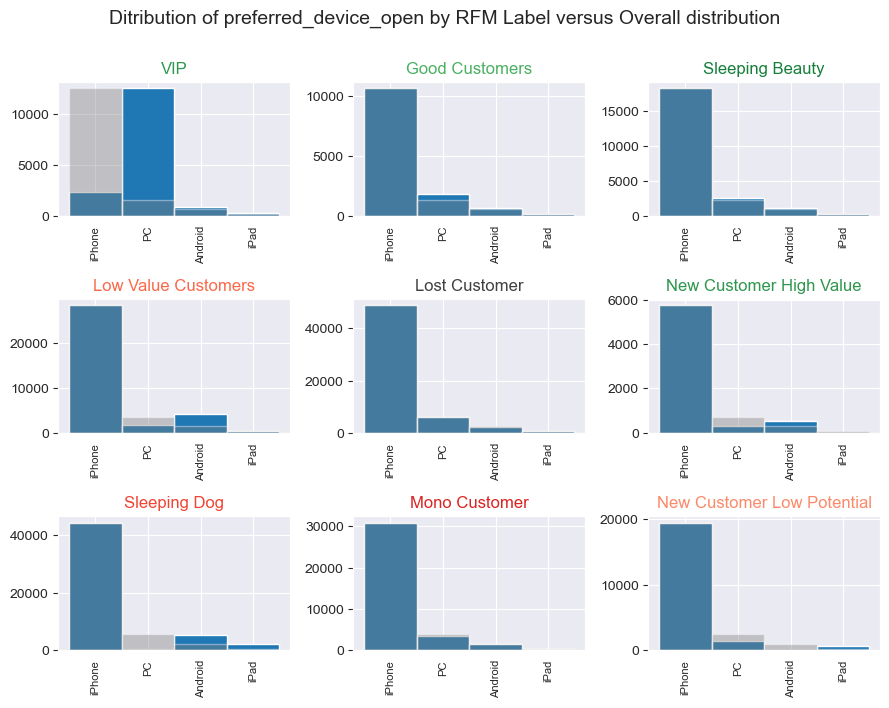

In [68]:
plot_histograms_by_category(df, 'preferred_device_open')

This indicates it might be good to create another features only counting one type of opens, for instance PC_opens.

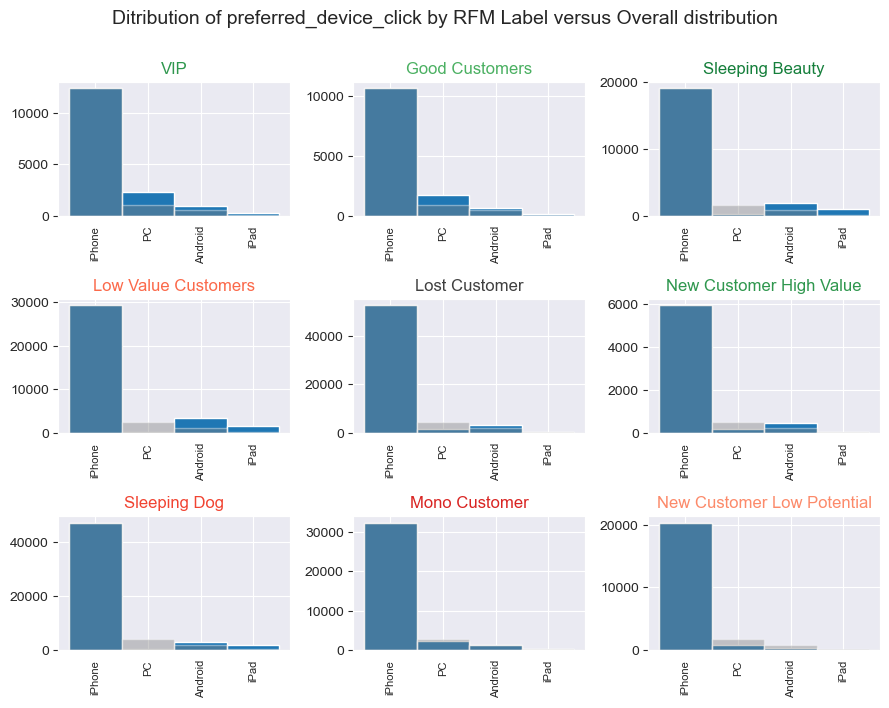

In [69]:
plot_histograms_by_category(df, 'preferred_device_click')

Similar comment, while keeping distinction between Android and PC.

##### Time since acquisition

Here we look at the difference in distribution on `days_since_acquisition`, to know if time since acquisition is a good differentiator in customer types, apart from how it defines branches in RFM segmentation

In [70]:
def plot_density_by_category(df, numerical_column):
    '''
    Plot one kdeplot per rfm_labels for a numerical column
    Compare distribution of different rfm_label    
    '''
    # Filter df to exclude 'Prospect' rfm_label
    df = df[(df['rfm_labels'] != 'Prospect') & (df[numerical_column].notna())].copy()
    
    # List of unique rfm_labels, sorted by mean of 'total_orders_amount'
    # we do this to increase readibility 
    unique_labels = df.groupby('rfm_labels')['total_orders_amount'].mean().sort_values(ascending=False).index   

    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(9, 7), tight_layout=True)
    axes = axes.ravel()

    for i, rfm_label in enumerate(unique_labels):
        data = df[df['rfm_labels'] == rfm_label][numerical_column]
        sns.kdeplot(data, ax=axes[i]) 
        axes[i].set_title(rfm_label, color=class_colors[rfm_label], fontsize=10)

    fig.suptitle(f'Ditribution of {numerical_column} by RFM Label versus Overall distribution', fontsize=14, y=1.005)
    plt.show()

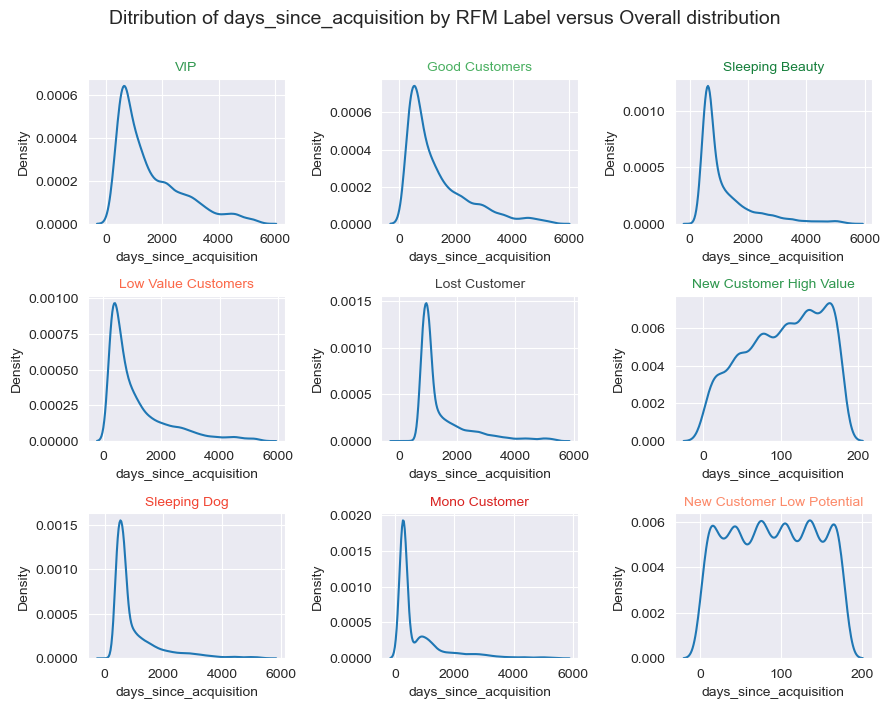

In [71]:
plot_density_by_category(df, 'days_since_acquisition')

After 2000days only some categories are well represented, such as VIP and Good Customers. At this point time since acquisition does not seem that valuable a feature.

#### ii) Relationships
> Explore relationships amongst the features themselves and with the target

From the [missing values part](#DataQuality), we chose to study only relationships with target_variable from the following rfm_labels
- Good Customers
- VIP
- Low Value Customers

They are the ones that show similarities in data completeness and they also present the advantage of being in the same branch of the RFM classification.

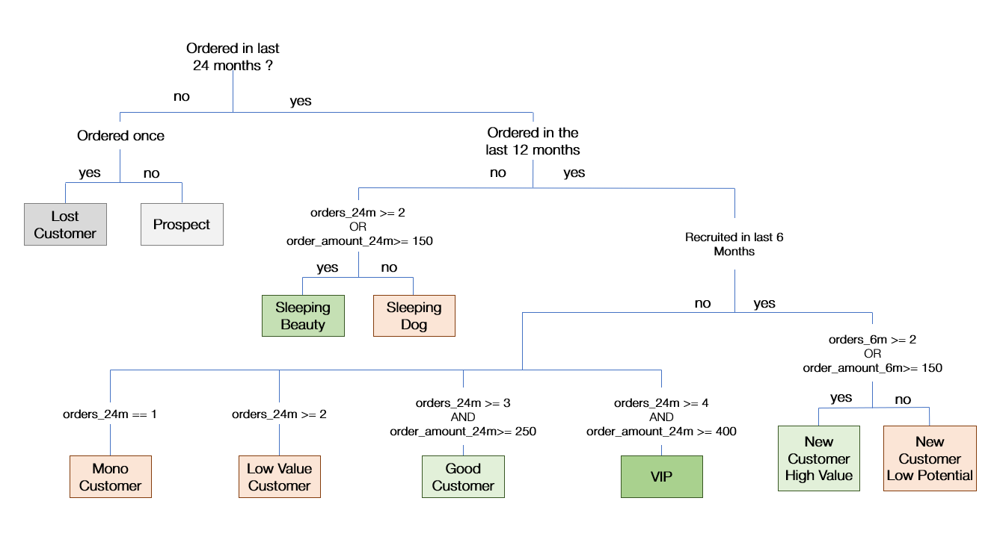

In [72]:
Image(filename='RFM.png', width=750, height=750)

In [73]:
df_subset = df.copy()

# List of RFM labels to keep
rfm_labels_to_keep = ['Good Customers', 'VIP', 'Low Value Customers']

# Filtering df_subset to keep
df_subset = df_subset[df_subset['rfm_labels'].isin(rfm_labels_to_keep)]

New Color palette for increasing readability in following charts

In [74]:
palette = sns.color_palette()
class_colors_scatters = {
    'Prospect': palette[0],
    'Lost Customer': palette[1],
    'Sleeping Dog': palette[3],
    'Sleeping Beauty': palette[9],
    'New Customer Low Potential': palette[4],    
    'New Customer High Value': palette[5],
    'Low Value Customers': palette[6],
    'Mono Customer': palette[7],
    'Good Customers': palette[8],
    'VIP': palette[2]
}

##### Investigating class imbalance

In [75]:
df_subset['target_label_12M'].value_counts()

Sleeping Beauty        16877
Sleeping Dog           13262
VIP                    13052
Low Value Customers    12269
Good Customers          8226
Mono Customer            112
Name: target_label_12M, dtype: int64

We remove Mono Customer as this creates too much of class imbalance

In [76]:
df_subset = df_subset[df_subset['target_label_12M'] != 'Mono Customer']

##### Colinearity

As this is a classification task, and we plan on running Logistic Legression, we study colinearity of our numerical features, as Logistic Regression is the classification equivalent of Linear Regression.

In [77]:
import itertools

In [78]:
def find_highest_correlated_columns(df,number_top_correlations):
    """
    Compute correlations from pairs of numerical columns from a dataframe df
    Returns the top number_top_correlations as a list
    Use to investigate ill-conditionning 
    """
    highest_correlated_columns = []
    
    # Iterating over all possible column pairs
    for col1, col2 in itertools.combinations(df.columns, 2):
        # Correlation between pair
        corr = df[col1].corr(df[col2])
        # Add to list
        highest_correlated_columns.append((col1, col2, round(corr,3)))
        # Sorting list by top correlations
        highest_correlated_columns.sort(key=lambda x: x[2], reverse=True)
    
    return highest_correlated_columns[:number_top_correlations]

In [79]:
find_highest_correlated_columns(df_subset.select_dtypes(include='number'),80)

[('days_since_second_order', 'days_since_third_order', 0.967),
 ('days_since_first_order', 'days_since_second_order', 0.958),
 ('order_amount_18m', 'order_amount_24m', 0.942),
 ('orders_18m', 'orders_24m', 0.927),
 ('order_amount_15d', 'order_amount_1m', 0.917),
 ('order_amount_12m', 'order_amount_18m', 0.906),
 ('days_since_first_order', 'days_since_third_order', 0.906),
 ('days_since_acquisition', 'days_since_first_order', 0.903),
 ('total_orders', 'total_orders_amount', 0.894),
 ('first_order_total_amount', 'first_order_total_quantity', 0.878),
 ('orders_12m', 'orders_18m', 0.875),
 ('second_order_amount_shift', 'second_order_quantity_shift', 0.867),
 ('days_since_acquisition', 'days_since_second_order', 0.866),
 ('second_order_total_amount', 'second_order_total_quantity', 0.849),
 ('third_order_total_amount', 'third_order_total_quantity', 0.844),
 ('third_order_amount_shift', 'third_order_quantity_shift', 0.84),
 ('order_amount_12m', 'order_amount_24m', 0.839),
 ('first_order_cat_d

From colinearity investigation, we get the following learnings
-  'order_amount_3m', 'order_amount_6m' for instance are highly colinear as the first 3 months are contained in 6 months. For those we will move to a few where we have Orders 0-3M and Orders 3-6M for instance.
- Need for chosing between order amount and order quantity metrics as in most cases they have high colinearity. We will chose amount as it can take more values that quantity.
- Diversity metrics are colinear. We will have to chose one, knowing the one that offers more granularity is item diversity
- Orders_with_promo_rate and average_order_promo_rate are highly colinear, here we also need to chose one
- Days metrics, while conceptually making sense are highly colinear.'days_since_first_order', 'days_since_third_order, 'days_since_acquisition' for instance. Here we will chose days_since_first_order as it the most straightforward.

##### Normality

In [80]:
def check_skewness(df):
    """
    Function to check for skewness in a dataframe's columns.
    Plots histograms of the columns to visually inspect skewness.
    Columns with skewness > 1 are potential candidates for transformation.    
    """
    # Number of charts horizontally
    TOTAL_WIDTH = 6
    # Select only numerical columns
    features = list(df.select_dtypes(include='number').columns)
    df_skew = df[features]
                
    # Calculate the number of rows needed to fit all the charts
    total_height = df_skew.shape[1] // TOTAL_WIDTH
    figure_height = df_skew.shape[1] / TOTAL_WIDTH * 2

    # Check if there are any extra columns that don't fit evenly into a full row
    if df_skew.shape[1] % TOTAL_WIDTH != 0:
    # If there are extra columns, we need an additional row
        total_height += 1

    fig, axes = plt.subplots(total_height,
                             TOTAL_WIDTH,
                             figsize=(2*TOTAL_WIDTH,figure_height))
    axes = axes.ravel()


    for i, col in enumerate(df_skew.columns):
        skewness = df[col].skew()
        axes[i].hist(df[col],bins=30)
        # Set the title of the subplot, small labels for readability
        axes[i].set_title(f'{col} {skewness:.2f}',fontdict={'fontsize': 8})
        
    plt.tight_layout()
        
    # Cleaning of unused axes
    for ax in axes.flatten():
        if not ax.has_data():
            ax.remove()
    plt.show()      

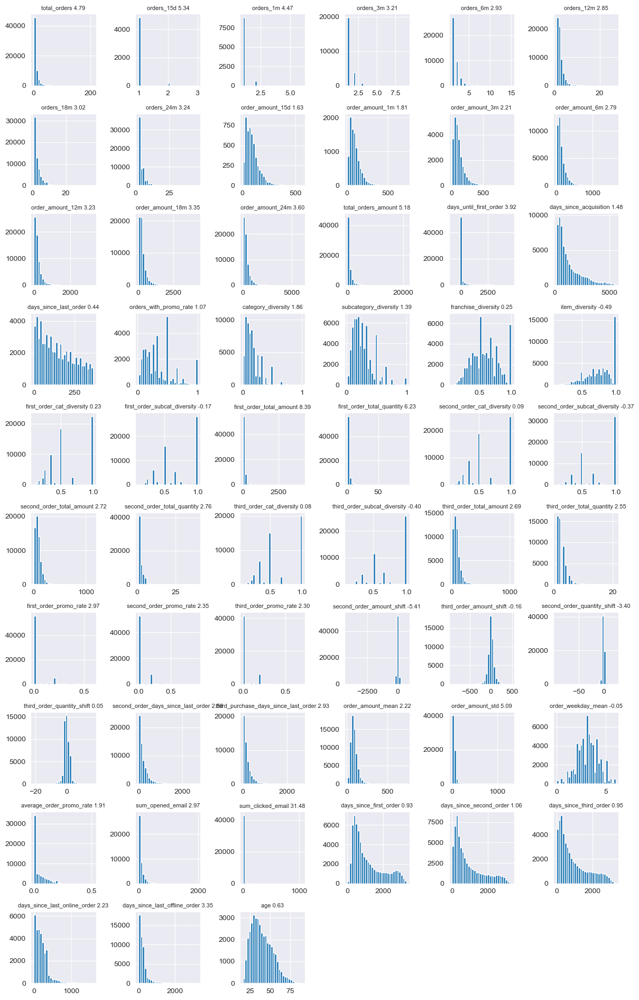

In [81]:
check_skewness(df_subset)

Most of our columns are heavily skewed, and this means potential feature engineering after we have reworked our feautres according to our first inspection on colinearity.

In [82]:
def transform_and_test_normality(df, column):
    # Create a figure with 3 subplots
    fig, axes = plt.subplots(1, 3, figsize=(7,2))

    axes[0].hist(df[column], bins=30)
    axes[0].set_title(column, size=10)    
    
    axes[1].hist(np.log1p(df[column]), bins=30)
    title = 'log1p_' + column
    axes[1].set_title(title, size=10)

    axes[2].hist(np.sqrt(df[column]), bins=30)
    axes[2].set_title('sqrt_' + column, size=10)
    
    plt.tight_layout()
    plt.show()

Summary of plot below, good candidates for :
- Log transformation : age, order_amount_mean, sum_opened_email, total_orders_amount
- Sqrt transformation : none
- No Transformation : all others

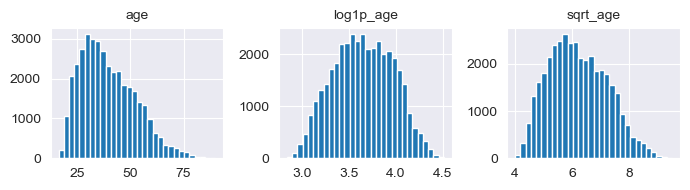

In [83]:
transform_and_test_normality(df_subset,'age')

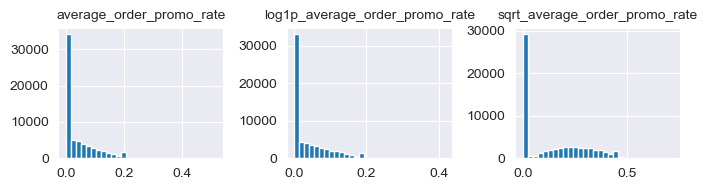

In [84]:
transform_and_test_normality(df_subset,'average_order_promo_rate')

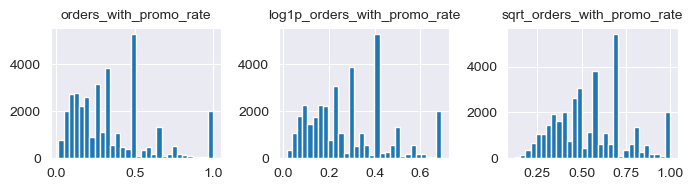

In [85]:
transform_and_test_normality(df_subset,'orders_with_promo_rate')

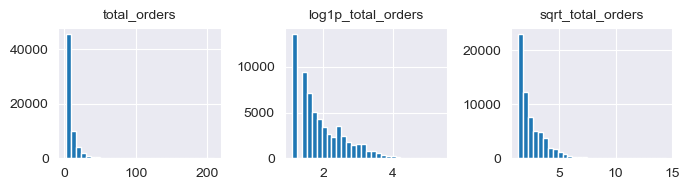

In [86]:
transform_and_test_normality(df_subset,'total_orders')

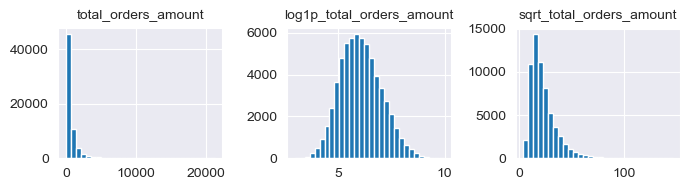

In [87]:
transform_and_test_normality(df_subset,'total_orders_amount')

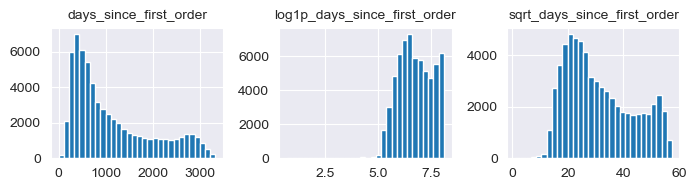

In [88]:
transform_and_test_normality(df_subset,'days_since_first_order')

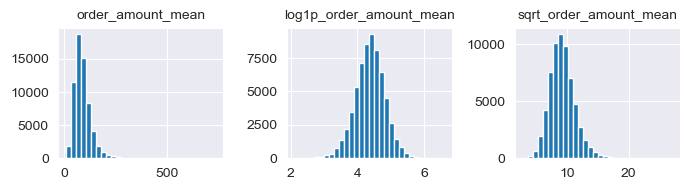

In [89]:
transform_and_test_normality(df_subset,'order_amount_mean')

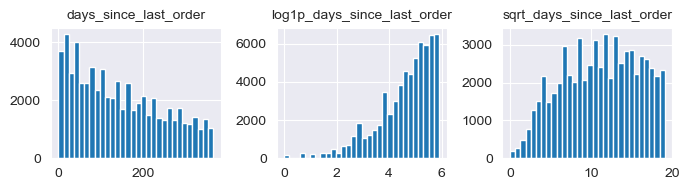

In [90]:
transform_and_test_normality(df_subset,'days_since_last_order')

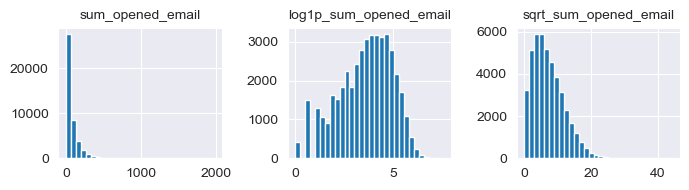

In [91]:
transform_and_test_normality(df_subset,'sum_opened_email')

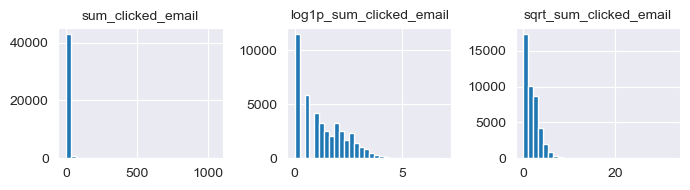

In [92]:
transform_and_test_normality(df_subset,'sum_clicked_email')

##### Numerical features

Here we investigate whether plotting two numerical variables per rfm_label and coloring by target_label helps create a cluster.

In [93]:
def plot_scatterplots_colored_by_target(df, col1, col2):
    """
    Plot subplots of scatter plots for each rfm_label with colored points based on target_label_12M values.
    """
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes = axes.flatten()

    for i, rfm_label in enumerate(df['rfm_labels'].unique()):
        # Filter dataframe by rfm_label
        subset = df[df['rfm_labels'] == rfm_label]

        # Cutoff of 2% top values to increase readability
        col1_cutoff = subset[col1].quantile(0.98)
        col2_cutoff = subset[col2].quantile(0.98)

        subset = subset[(subset[col1] <= col1_cutoff) & (subset[col2] <= col2_cutoff)]

        # Plot scatter with same color map for all subplots
        sns.scatterplot(
            x=col1,
            y=col2,
            hue='target_label_12M',
            palette=class_colors_scatters,
            s=8,
            alpha=0.8,
            data=subset,
            ax=axes[i],
            legend='brief'
        )

        axes[i].set_title(f"RFM Label: {rfm_label}")
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)
        axes[i].legend().remove()

    # Set common legend on top of chart
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.005), ncol=len(labels))
    fig.suptitle(f"{col1} vs {col2}", fontsize=14, y=1.05)

    plt.tight_layout()
    plt.show()

###### Email behaviors

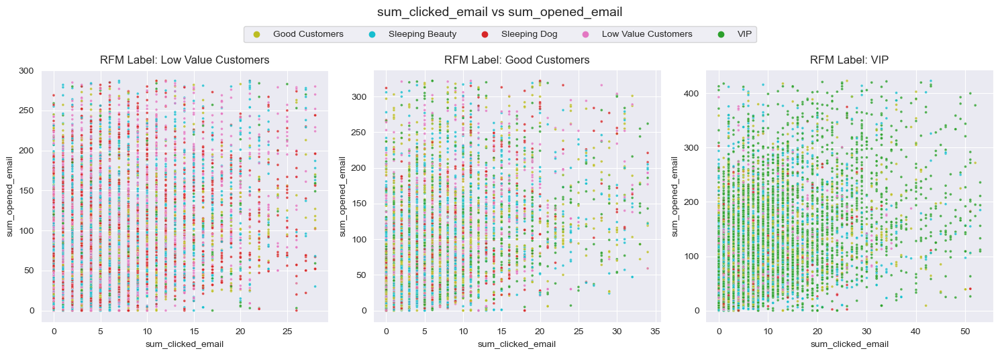

In [94]:
plot_scatterplots_colored_by_target(df_subset, 'sum_clicked_email','sum_opened_email')

There is no visual clusters of target based on email interactions

###### Recent orders amount

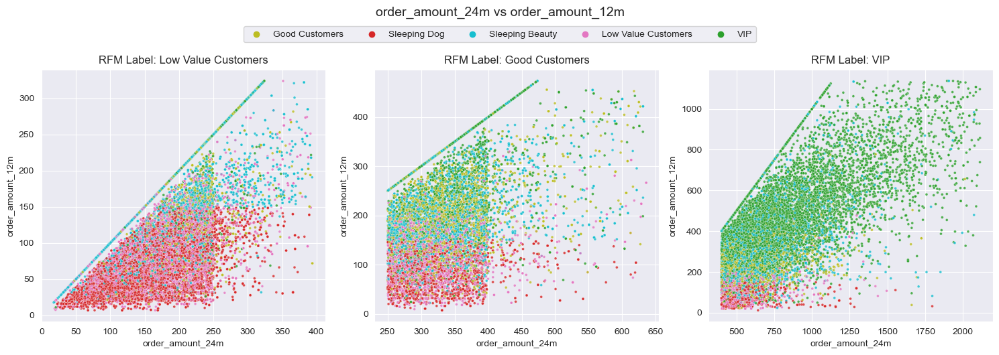

In [95]:
plot_scatterplots_colored_by_target(df_subset, 'order_amount_24m','order_amount_12m')

Order amounts are good at distinguish clusters. It seems intuitive that order amount during last year and the year before is indicative of future orders. It could also be that order behavior is totally erratic and a lot of jumping to competition happens. But it does not seem to be the case.

###### Time since order, since acquisition

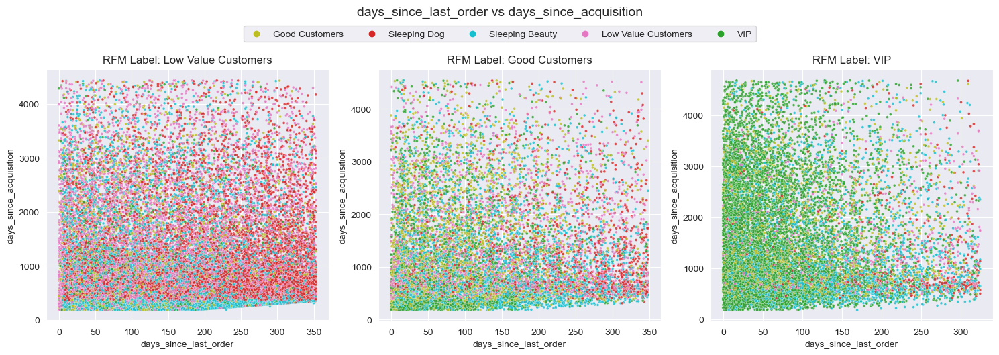

In [96]:
plot_scatterplots_colored_by_target(df_subset, 'days_since_last_order','days_since_acquisition')

Here it is quite clear that days_since_acquistion is not predictive of future class, where days since last order does a good job. Colors are much more differentiated horizontally than vertically. It matches finding on recent orders.

###### First and Second Order Amounts

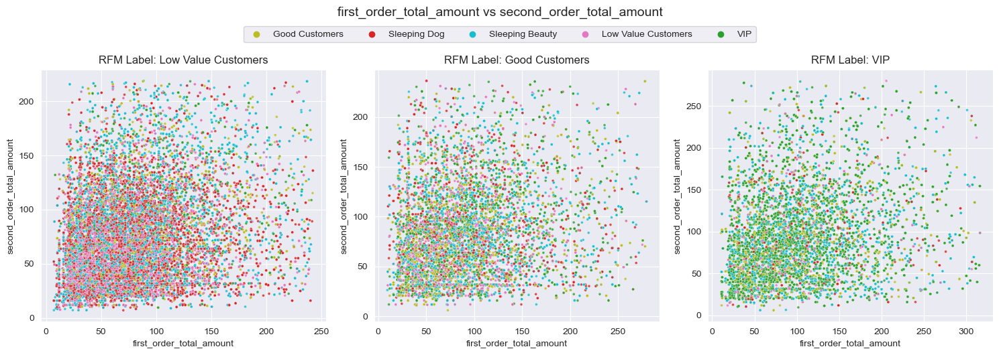

In [97]:
plot_scatterplots_colored_by_target(df_subset, 'first_order_total_amount','second_order_total_amount')

Interesting to see that first and second order amounts are not clear predictor of target label

###### Days between first orders

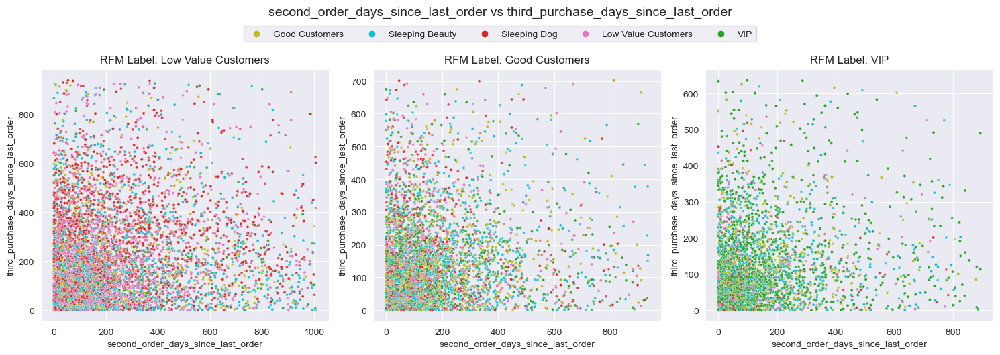

In [98]:
plot_scatterplots_colored_by_target(df_subset, 'second_order_days_since_last_order','third_purchase_days_since_last_order')

Here it is also not clear that rebuying quickly second and third time are indicator of future class.

###### Avg Order Value

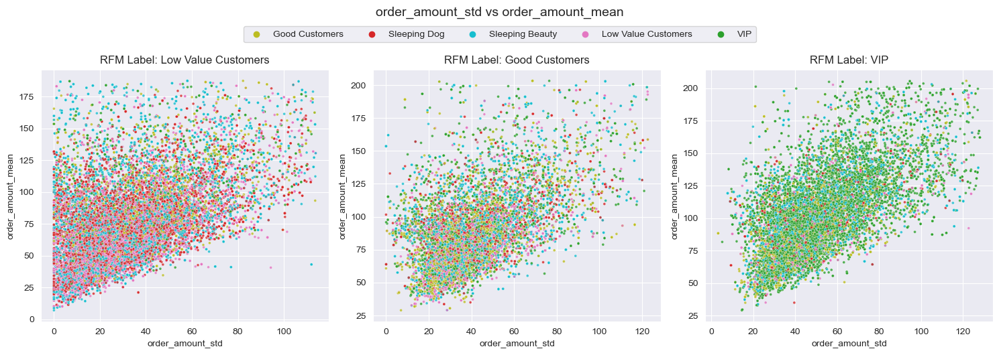

In [99]:
plot_scatterplots_colored_by_target(df_subset, 'order_amount_std','order_amount_mean')

Same here, contrary to what could be thought, average order values are not clear at clusterising future RFM class. This is interesting it translates that some customers prefer to order small amounts and multiply purchases, while other will stock up. We will try to detect stocker by plotting average order value

In [100]:
def add_days_between_orders(df):
    """
    Adds a new column called days_between_orders
    days_since_first_order divided by the total number of orders.
    """
    # Calculate the days between orders, only when both 'days_since_last_order' and 'total_orders' are not na
    df['days_between_orders'] = df.apply(lambda row: row['days_since_last_order']/row['total_orders'] 
                                         if pd.notna(row['days_since_last_order']) and pd.notna(row['total_orders']) 
                                         else pd.NA, axis=1)
    
    return df

In [101]:
df_subset = add_days_between_orders(df_subset)

###### Days between orders

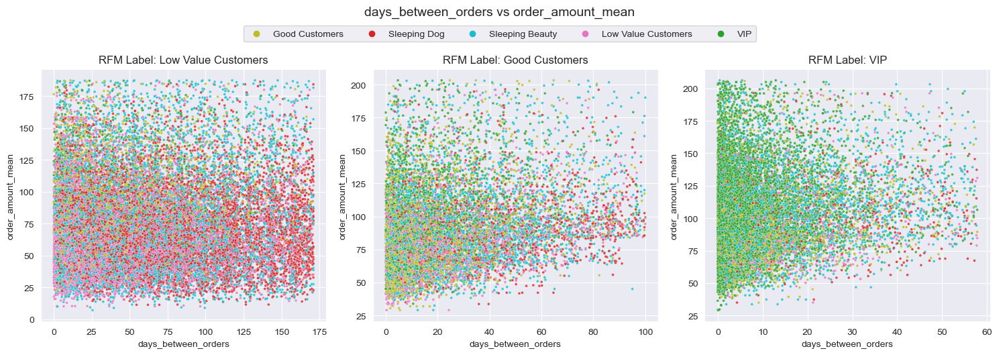

In [102]:
plot_scatterplots_colored_by_target(df_subset, 'days_between_orders','order_amount_mean')

Number of days in average between orders seems to be good at clusterising. It seems the shorter the better chance of mainting VIP status of instance. It seems also that that number is very low for VIP that stay VIP that seems to be averaging nearly 15 days max.

###### Promo

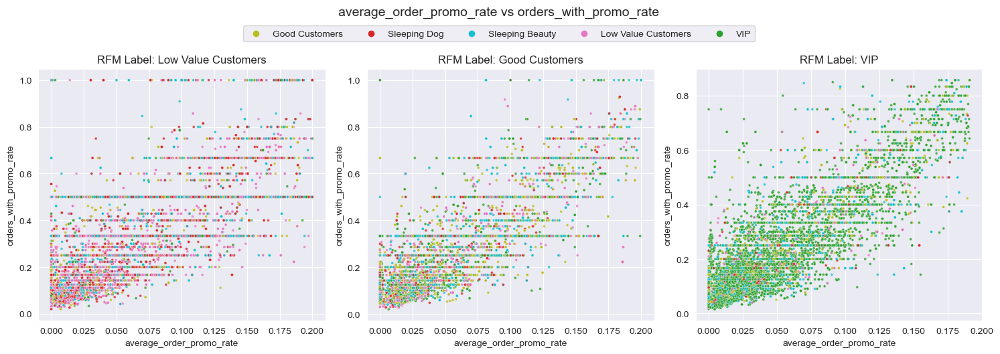

In [103]:
plot_scatterplots_colored_by_target(df_subset, 'average_order_promo_rate','orders_with_promo_rate')

Promo behavior is not visually indicating clusters, which would mean that there is not promo hunting type of behavior among some cohort of customers.

###### Item diversity

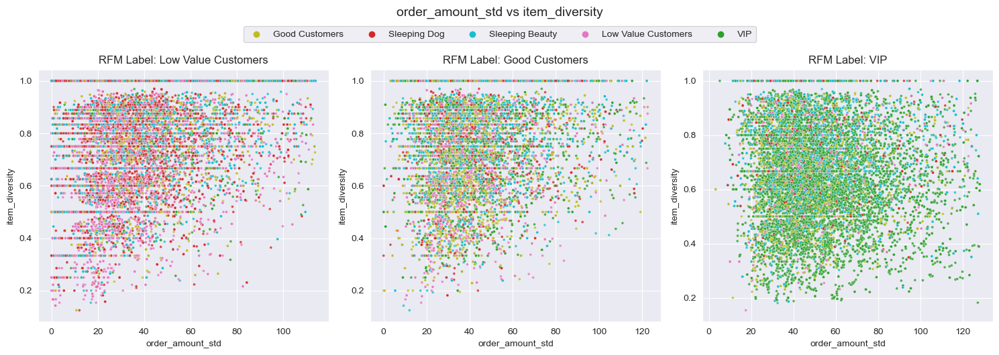

In [104]:
plot_scatterplots_colored_by_target(df_subset, 'order_amount_std','item_diversity')

Here again, not clear to interpret if buying different items correlates with a cluster

##### Histograms by rfm_label by target_label

Here, we follow idea for descriptive statistics part, where we wanted to further study whether distribution for a rfm_label was the same for each value in target variable.

Can we detect feature that present a relationship to target variable in each rfm_label ?

In [105]:
def plot_histogram_top_target_labels(df, cat_col):
    '''
    Plot for each rfm_label in df three histograms 
    that look at distribution of cat_col for each target_label_12M    
    '''
    df = df[df[cat_col].notna()].copy()

    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(11, 9))
    axes = axes.flatten()
    
    # Get the value counts of cat_col and sort by number of records
    cat_col_counts = df[cat_col].value_counts().sort_values(ascending=False)
    cat_col_vals = cat_col_counts.index.tolist()
    bins = np.arange(len(cat_col_vals)+1)-0.5
    
    # First iterate over rfm_labels
    for i, rfm_label in enumerate(df['rfm_labels'].unique()):
        rfm_df = df[df['rfm_labels'] == rfm_label]
        
        # Overall distribution of the categorical column
        overall_counts = rfm_df[cat_col].value_counts()
        
        # Get top 3 values of target_labels_12m
        top_target_labels = rfm_df['target_label_12M'].value_counts().nlargest(3).index
        
        # Iterate over top target_labels_12m and plot a histogram
        for j, target_label in enumerate(top_target_labels):
            ax = axes[i*3+j]
            label_df = rfm_df[rfm_df['target_label_12M'] == target_label]
            ax.hist(label_df[cat_col], bins=bins)
            ax.set_xticks(np.arange(len(cat_col_vals)))
            ax.set_xticklabels(cat_col_vals, rotation=90, fontsize=8)
            ax.set_title(f'RFM: {rfm_label}\nTarget: {target_label}')
            
            # Add overall distribution on right axis, and in grey
            ax2 = ax.twinx()
            ax2.hist(overall_counts.index, weights=overall_counts.values, alpha=0.4, color='gray',bins=bins)
            ax2.tick_params(axis='y', right=False, labelright=False)        
            ax2.grid(False)
            
    fig.suptitle(f'Histograms of {cat_col} by RFM label and top target labels', fontsize=16)  
    fig.subplots_adjust(hspace=1, wspace=0.3)
    plt.show()


###### Email_domain

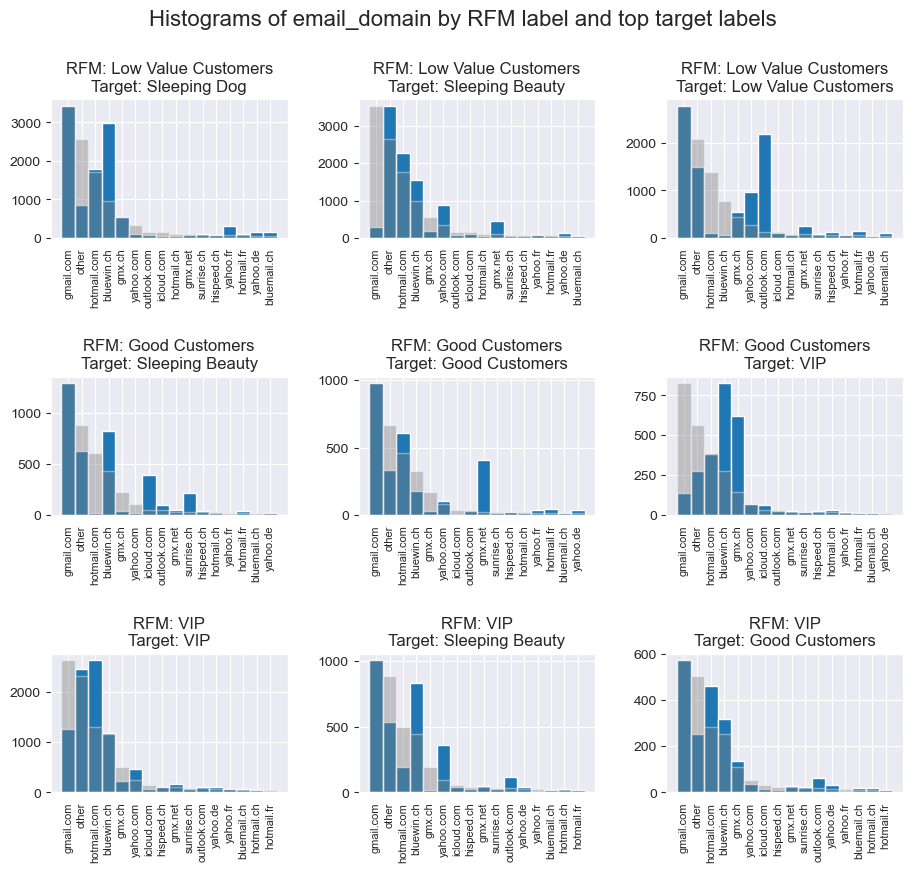

In [106]:
plot_histogram_top_target_labels(df_subset, 'email_domain')

It looks good, at rfm_label level, target classes are differentiated between each email domains. What catches my attention for instance is outlook.com for existing VIP or hotmail.com. Does it indicates high purchase power expatriates ? Seems also to be true of Good Customers that remain Good Customers. gmx.ch is also over repreesented on VIP that become Sleeping Beauty 

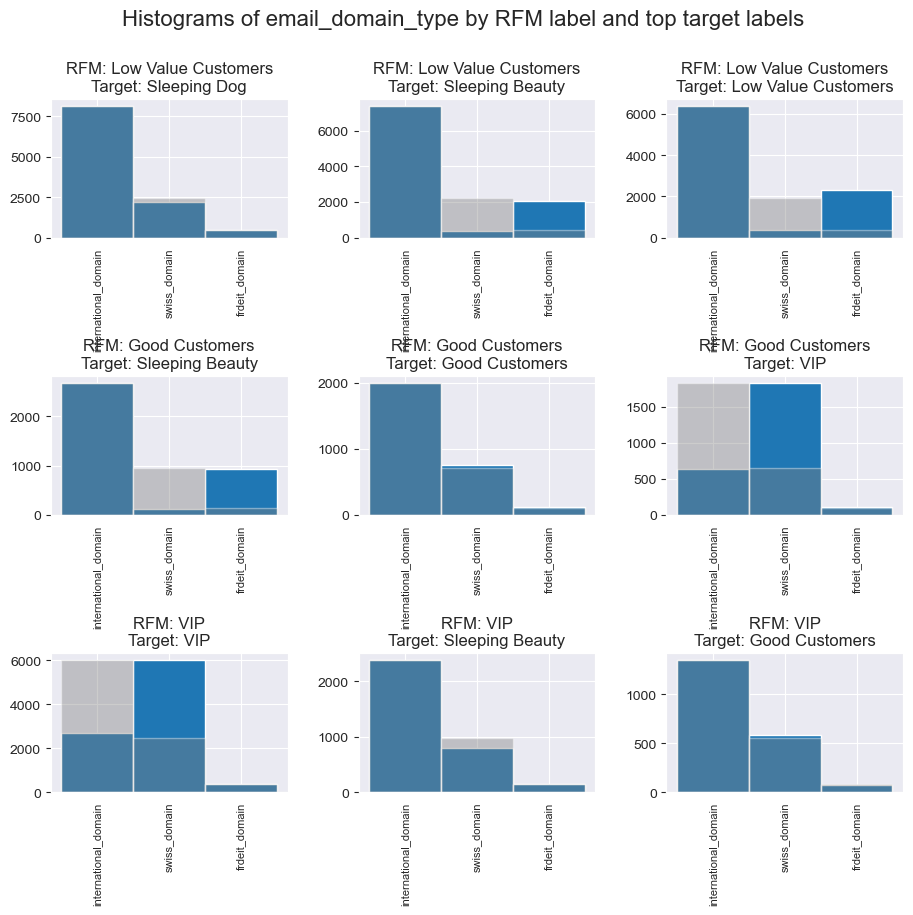

In [107]:
plot_histogram_top_target_labels(df_subset, 'email_domain_type')

I like how swiss_domains over represented in Good Customers that becomes VIP. 

###### Socio-demo

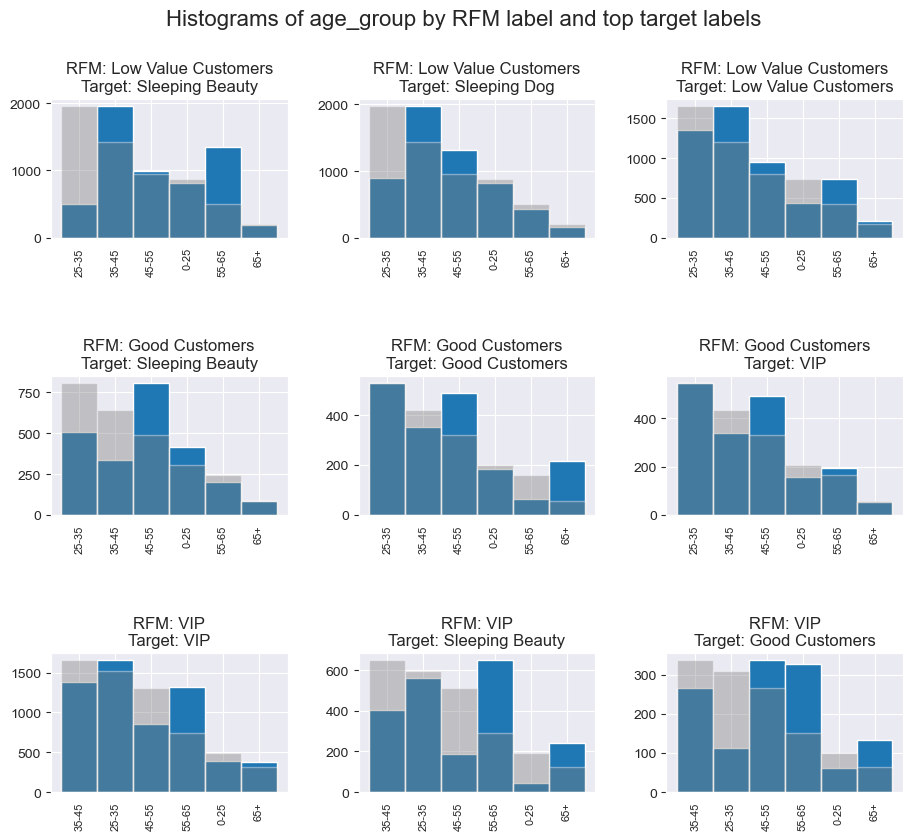

In [108]:
plot_histogram_top_target_labels(df_subset, 'age_group')

`age_group` is visually good to differentiate at rfm_label level between target values.
- Over representation of 65+ that stay at Good Customers level
- Over representation of 0-25 that are VIPs and stay VIPs

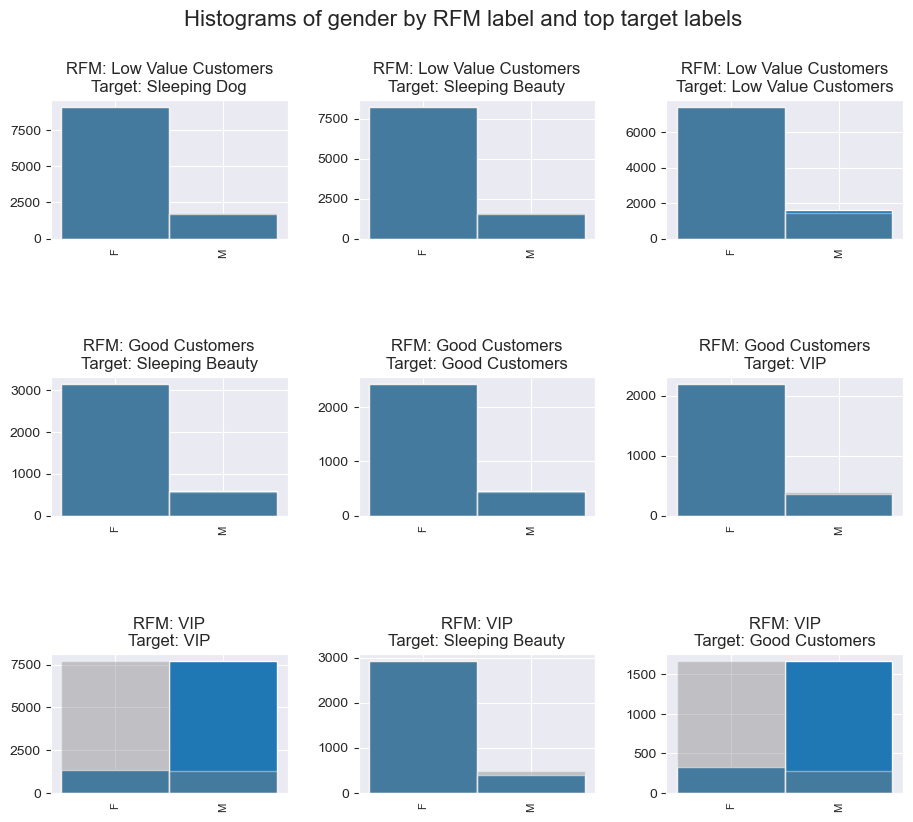

In [109]:
plot_histogram_top_target_labels(df_subset, 'gender')

Something as straightforward as gender does not seems to be a good indicator, unless for Low Value Customers that stay in their class.

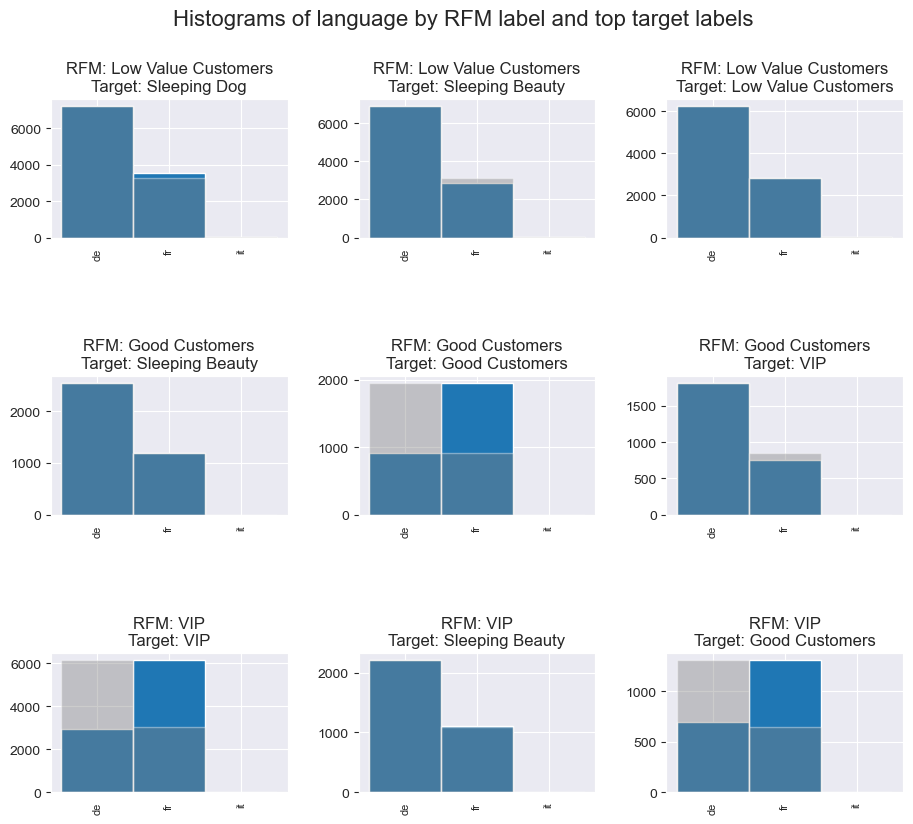

In [110]:
plot_histogram_top_target_labels(df_subset, 'language')

Similar comment on language, it does not seem to overall differentiate, except for certain classes

###### top_subcategory

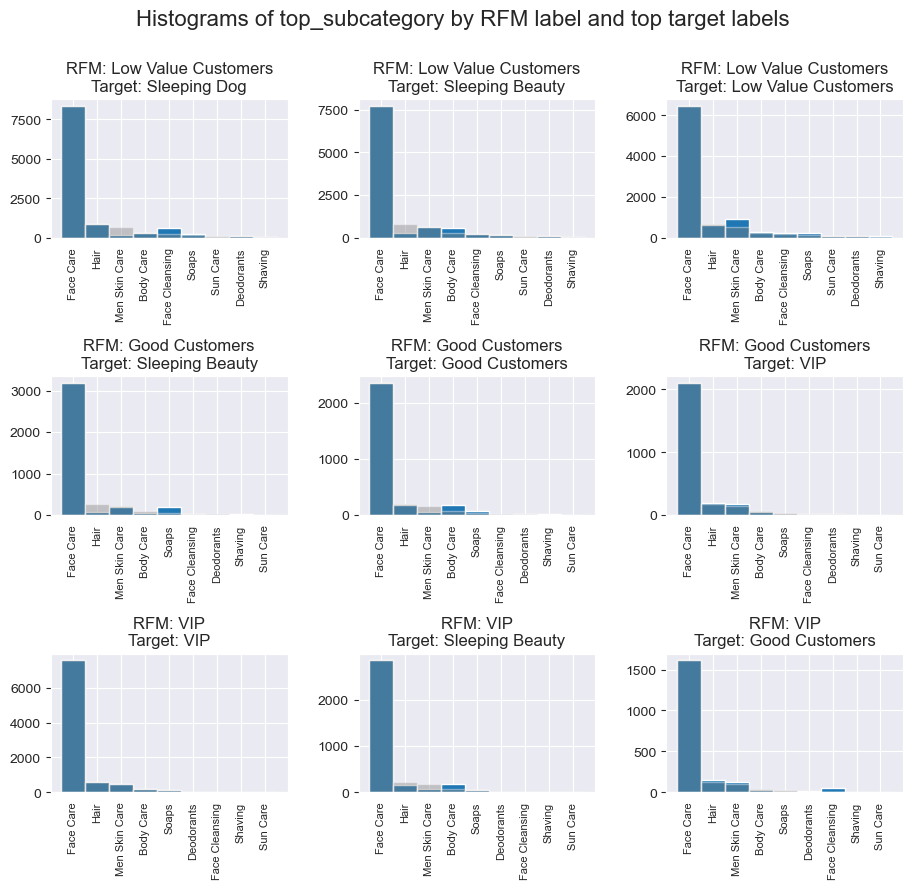

In [111]:
plot_histogram_top_target_labels(df_subset, 'top_subcategory')

Top_subcategory seems to be useless in this stage in differentiating .

###### top_devices

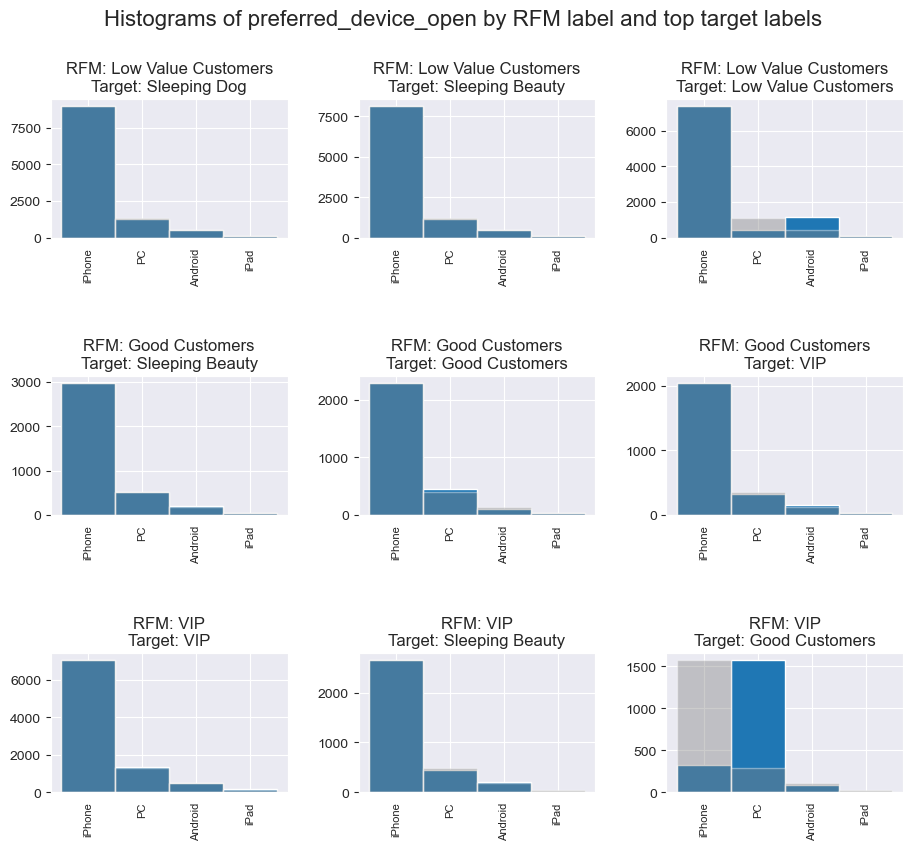

In [112]:
plot_histogram_top_target_labels(df_subset, 'preferred_device_open')

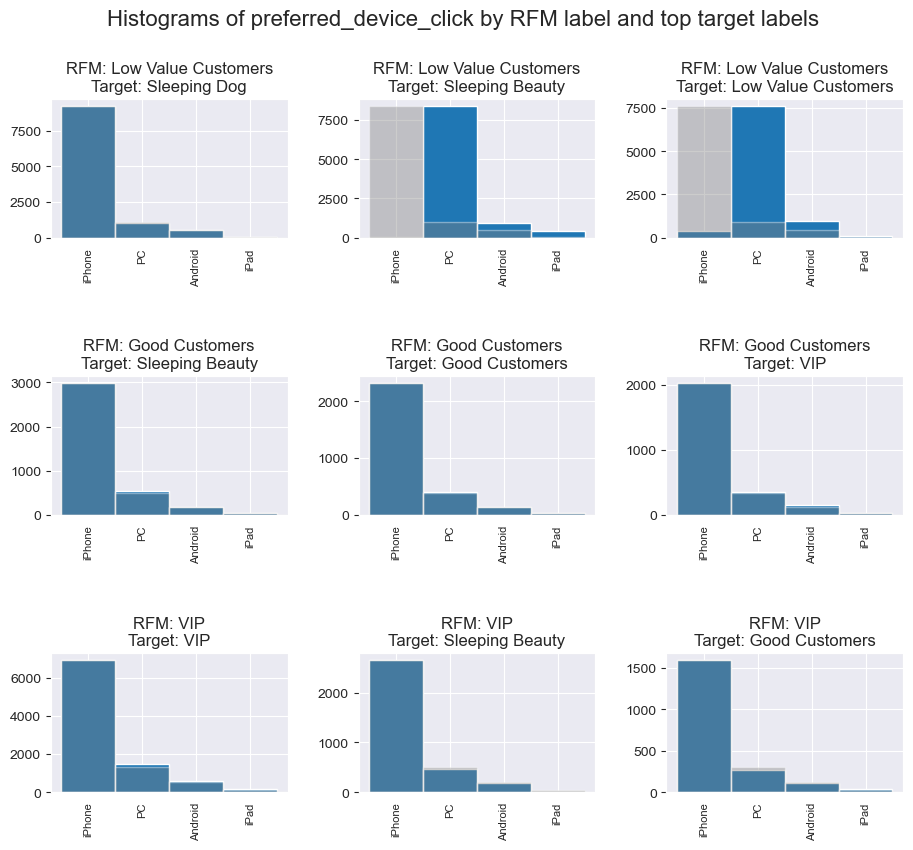

In [113]:
plot_histogram_top_target_labels(df_subset, 'preferred_device_click')

Nice to see that opening and clicking on PC is a behavior from Good Customers that go VIP. Gives idea of feature engineering such as share of PC email opens and share of PC email clicks.

#### iii) Missing values and outliers

##### Missing values

###### Orders related

For anything with missing values on orders, we plan to replace missing values by 0 as 0 is the value for no interaction with orders. We also include zero for order promo rate columns as 0 is default value, meaning no promo.

In [114]:
def replace_missing_values_orders(df):
    """
    Replace missing values for float columns that contain 'order' in their names,
    excluding any columns with 'promo_rate' or 'diversity',
    and also including 'sum_opened_email' and 'sum_clicked_email' columns
    """
    excluded_names = ['diversity','weekday','mode']

    order_cols = df.select_dtypes(include=['float']).filter(like='order').columns

    filtered_cols = [col for col in order_cols if not any(excl_name in col for excl_name in excluded_names)]
    
    # Add email interaction columns
    filtered_cols += ['sum_opened_email', 'sum_clicked_email']
    print(filtered_cols)
    # Replace missing values with 0 in filtered columns
    df[filtered_cols] = df[filtered_cols].fillna(0)
    
    return df

In [115]:
df = replace_missing_values_orders(df)

['total_orders', 'orders_15d', 'orders_1m', 'orders_3m', 'orders_6m', 'orders_12m', 'orders_18m', 'orders_24m', 'order_amount_15d', 'order_amount_1m', 'order_amount_3m', 'order_amount_6m', 'order_amount_12m', 'order_amount_18m', 'order_amount_24m', 'total_orders_amount', 'days_until_first_order', 'days_since_last_order', 'orders_with_promo_rate', 'first_order_total_amount', 'first_order_total_quantity', 'second_order_total_amount', 'second_order_total_quantity', 'third_order_total_amount', 'third_order_total_quantity', 'first_order_promo_rate', 'second_order_promo_rate', 'third_order_promo_rate', 'second_order_amount_shift', 'third_order_amount_shift', 'second_order_quantity_shift', 'third_order_quantity_shift', 'second_order_days_since_last_order', 'third_purchase_days_since_last_order', 'order_amount_mean', 'order_amount_std', 'average_order_promo_rate', 'days_since_first_order', 'days_since_second_order', 'days_since_third_order', 'days_since_last_online_order', 'days_since_last_off

###### Order diversity

Order diversity of 1 assumes all items were different, we can set default value for missing values to 1 as well, as if there is no product, they are in a sense all different.

In [116]:
def replace_missing_values_diversity(df):
    """
    Replace missing values for order_diversity columns by 1
    """
    diversity_cols = df.select_dtypes(include=['float']).filter(like='diversity').columns
    print(diversity_cols)
    # Replace missing values with 0 in filtered columns
    df[diversity_cols] = df[diversity_cols].fillna(1)
    
    return df

In [117]:
df = replace_missing_values_diversity(df)

Index(['category_diversity', 'subcategory_diversity', 'franchise_diversity',
       'item_diversity', 'first_order_cat_diversity',
       'first_order_subcat_diversity', 'second_order_cat_diversity',
       'second_order_subcat_diversity', 'third_order_cat_diversity',
       'third_order_subcat_diversity'],
      dtype='object')


###### Remaining missing values

In [118]:
df.loc[:, df.isnull().any()].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264000 entries, 0 to 263999
Data columns (total 13 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   zip_code              223758 non-null  object  
 1   purchase_channel      260255 non-null  object  
 2   top_category          260255 non-null  object  
 3   top_subcategory       260255 non-null  object  
 4   top_franchise         260255 non-null  object  
 5   top_item              260255 non-null  object  
 6   first_order_channel   260254 non-null  object  
 7   second_order_channel  142556 non-null  object  
 8   third_order_channel   99541 non-null   object  
 9   order_time_mode       260255 non-null  object  
 10  order_weekday_mean    260255 non-null  float64 
 11  age                   112065 non-null  float64 
 12  age_group             112065 non-null  category
dtypes: category(1), float64(2), object(10)
memory usage: 24.4+ MB


On what is left
- `zip_code` will be replaced through data engineering and we will take methods to replace missing values on population density of dwelling for instance by taking means (possibly coupled with other features, similar to take means of same gender same age group)
- `age` we will replace by average of mean for same `gender` and same `recruitment_source`. Being recruited offline or on website can be indicative of an audience (for instance Facebook does not have the same audience as Tiktok, and Websites do not have the same audience as Point of Sales). We also add `rfm_labels` as we saw in descriptive statistics that 
- Other missing values for categorical columns are OK as we will use one hot encoding on non missing values.

In [119]:
def replace_missing_age(df):
    '''
    This function replaces missing values in 'age'
    by taking the grouped average of age for 'recruitment_source' and 'gender'.
    '''
    # Group df by 'recruitment_source' and 'gender'
    grouped = df.groupby(['recruitment_source', 'gender', 'rfm_labels'])
    
    # Calculate mean age for each group
    mean_age = grouped['age'].mean()
    
    # Replace missing values in 'age' with corresponding group mean age
    missing_age_mask = pd.isnull(df['age'])
    df.loc[missing_age_mask, 'age'] = df.loc[missing_age_mask].apply(lambda row: mean_age.loc[(row['recruitment_source'], row['gender'], row['rfm_labels'])], axis=1)
    
    return df

In [120]:
df = replace_missing_age(df)

##### Outliers
###### Numerical Columns by rfm_label

Here,  we also focus on our preferred subset.

In [121]:
df_subset = df.copy()

# List of RFM labels to keep
rfm_labels_to_keep = ['Good Customers', 'VIP', 'Low Value Customers']

# Filtering df_subset to keep
df_subset = df_subset[df_subset['rfm_labels'].isin(rfm_labels_to_keep)]

We initialize a column named 'outlier' to be able to flag and count outliers. Note that we are using zscore even though we are not normally distributed columns, where arguably IQR would have been a better choice. 

As seen previously from colinearity and normality inspection, we intend to change numerical features to decrease colinearity and increase normality and then zscore would make more sense (in case of close to a normal distributed variable).

The following code in an example of how we would display visually outlier boundary by zscore and then mark them in dataframe.

In [122]:
df_subset["outlier"] = 0

In [123]:
def plot_hist_by_rfm_label(df, column, number_zscore):
    """
    Creates a histogram for each value of 'rfm_label'
    Adds vertical lines for 'number_zscore' z-scores on each histogram
    Plots histograms in order of increasing mean of 'df[column]' for each 'rfm_label'
    """
    fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(10, 8), tight_layout=True)
    axes = axes.ravel()

    # Get unique values of 'rfm_labels' and their mean 'df[column]' values
    unique_labels = df.groupby('rfm_labels')[column].mean().sort_values(ascending=False).index

    # For every value of 'rfm_label' plot a histogram
    for i, rfm_label in enumerate(unique_labels):
        # Extracting data for current 'rfm_label'
        data = df[df['rfm_labels'] == rfm_label][column]

        axes[i].hist(data, bins=50, alpha=0.7)

        axes[i].set_title(rfm_label, color=class_colors[rfm_label])
        axes[i].set_xlabel(column)

        # Adding vertical red lines for 'number_zscore' z-scores
        # This indicates visually where we would remove outliers
        mean = np.mean(data)
        std = np.std(data)
        axes[i].axvline(x=mean + number_zscore*std, color='red', alpha=0.3)
        axes[i].axvline(x=mean - number_zscore*std, color='red', alpha=0.3)

    fig.suptitle(f'Histogram of {column} by RFM Label', fontsize=14, y=1.005)
    
    for ax in axes.flatten():
        if not ax.has_data():
            ax.remove()
    plt.show()

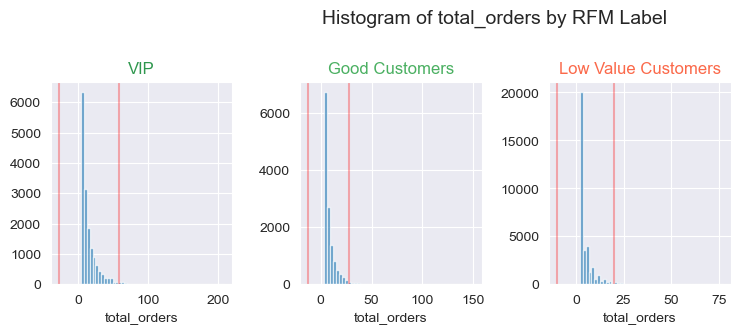

In [124]:
plot_hist_by_rfm_label(df_subset, 'total_orders', 3)

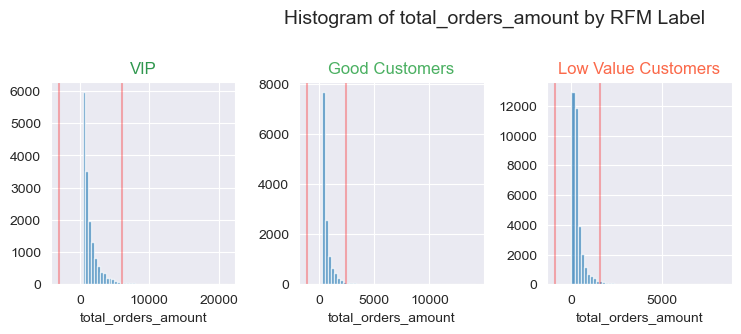

In [125]:
plot_hist_by_rfm_label(df_subset, 'total_orders_amount', 3)

In [126]:
def mark_outliers_by_rfm_label(df, column, number_zscore):
    """
    Identifies outliers for each value of rfm_label and marks them by setting outlier column to 1.
    Outliers are defined as values above or below number_zscore z-scores from the mean of df[column]
    """
    # For every value of rfm_label, identify outliers and mark them
    for rfm_label in df['rfm_labels'].unique():
        # Extracting data for current rfm_label
        data = df.loc[df['rfm_labels'] == rfm_label, column]

        # Calculate mean and standard deviation
        mean = np.mean(data)
        std = np.std(data)

        # Identify outliers
        outliers_mask = (data < mean - number_zscore*std) | (data > mean + number_zscore*std)

        # Mark outliers by setting 'outlier' column to 1
        df.loc[(df['rfm_labels'] == rfm_label) & outliers_mask, 'outlier'] = 1

    # Display outlier counts in a table
    outlier_counts_df = df.pivot_table(index='rfm_labels',
                                        columns='target_label_12M',
                                        values='outlier',
                                        aggfunc='sum',
                                        margins=True,
                                        margins_name='Total')
    # Remove decimals
    display(outlier_counts_df.style.format('{:,.0f}'))

In [127]:
mark_outliers_by_rfm_label(df_subset, 'total_orders_amount', 3)

target_label_12M,Good Customers,Low Value Customers,Mono Customer,Sleeping Beauty,Sleeping Dog,VIP,Total
rfm_labels,,,,,,,
Good Customers,57,60,0,56,34,62,269
Low Value Customers,131,253,2,121,199,59,765
VIP,17,6,0,27,2,277,329
Total,205,319,2,204,235,398,"1,363"


In [128]:
mark_outliers_by_rfm_label(df_subset, 'total_orders', 3)

target_label_12M,Good Customers,Low Value Customers,Mono Customer,Sleeping Beauty,Sleeping Dog,VIP,Total
rfm_labels,,,,,,,
Good Customers,114,85,0,66,43,82,390
Low Value Customers,169,408,3,167,247,68,"1,062"
VIP,29,8,0,31,2,378,448
Total,312,501,3,264,292,528,"1,900"


###### Pairplot

Once we have cleaned / reworked our features to reduce colinearity, we can apply some feature engineering to increase normality of distribution of those features. This should also help us investigating visually outliers with a Pairplot. Which is hard to do at this stage.


###### Other outliers detection techniques

If time permits, we would like to investigate other outliers detection methods such as found in [this article](https://towardsdatascience.com/detecting-outliers-with-simple-and-advanced-techniques-cb3b2db60d03). It could be an interesting endeavour to investigate those outliers detection techniques, also looking at [scikit learn doc](https://scikit-learn.org/stable/modules/outlier_detection.html#overview-of-outlier-detection-methods)

__Local Outlier Factor (LOF)__ [scikit doc](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.LocalOutlierFactor.html)

> The strength of the LOF algorithm is that it takes both local and global properties of datasets into consideration: it can perform well even in datasets where abnormal samples have different underlying densities. The question is not, how isolated the sample is, but how isolated it is with respect to the surrounding neighborhood.

From doc, we learn that k=20 is a good number to try out, assuming outliers in our dataset are limited, which we assume for simplicity. Meaning for each point it compares how far is a point to its 20 neighbors and based on this determines if the point is an outlier. It is close in concept to KNN classifier but for outliers detection.

__Isolation Forest__ [scikit doc](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.IsolationForest.html#sklearn.ensemble.IsolationForest)
> One efficient way of performing outlier detection in high-dimensional datasets is to use random forests. The ensemble.IsolationForest ‘isolates’ observations by randomly selecting a feature and then randomly selecting a split value between the maximum and minimum values of the selected feature.

> Since recursive partitioning can be represented by a tree structure, the number of splittings required to isolate a sample is equivalent to the path length from the root node to the terminating node.
This path length, averaged over a forest of such random trees, is a measure of normality and our decision function.

> Random partitioning produces noticeably shorter paths for anomalies. Hence, when a forest of random trees collectively produce shorter path lengths for particular samples, they are highly likely to be anomalies.'


To rephrase, Isolation Forest works by constructing multiple decision trees that try to isolate individual data points. The basic idea is that outliers will be isolated more quickly than 'normal' data points because they are farther away from the bulk of the data.

For each tree in the forest, the algorithm selects a random feature and a random split value between the minimum and maximum values of that feature. It then partitions the data points based on this split value.

The length from the root to the last node represents the number of splits required to isolate a sample. Outliers are expected to have shorter path lengths on average because they are more easily separable from the rest of the data (in average).

By averaging the path lengths over a forest of trees, the algorithm produces marks outliers.

__DBSCAN__ [article](https://www.analyticsvidhya.com/blog/2020/09/how-dbscan-clustering-works/), [scikit doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html)

Similar to Local Outlier Factor, DBSCAN penalizes data points that are farther away. It groups together data points that are closely packed based on a distance metric and a density threshold (number of points to group together). Unlike LOF, DBSCAN does not require the selection of the number of neighbors (k). Instead, it requires the selection of the radius (eps) and the minimum number of points (min_samples) to form a dense region.


__Note__

If we are to use these outliers detection techniques, we will try them with and without PCA as from my understanding DBSCAN and LOF are distance based outliers identification techniques, and distance is less meaningful in high dimensionality. 

We will also prefer testing them all three with conservative parameters at first and taking point that are flagged as outliers by all three methods. We have limited practical knowledge from these techniques, and limited implementation experience, so we should favor a conservative approach.

### (b) How does the EDA inform your project plan?

#### i) Patterns
> What interesting patterns do you observe in the data? What problems do you identify?
> You should describe any patterns or trends you have discovered, such as correlations, outliers, or unusual distributions, and any problems or anomalies that may affect the accuracy or reliability of your analysis. Identifying these issues early on will help you to address them and improve the quality of your results.

Learnings at this point, from the different past sections

__Overview of data__

- That a dummy predictor that predicts only one class can perform well for certain classes such as Lost Customer, Sleeping Dog, and Sleeping Beauty. The classes that are the most interesting for further analysis are Good Customers/Low Value Customers and VIP, as improving the prediction accuracy for these classes could have a positive impact on marketing activities. 

- We also learned that predicting a label three months or one year after may not significantly vary for classes such as Lost Customer or VIP. However, for classes such as Good Customers/Low Value Customers, extending the prediction range to one year can double the variation of rfm_labels. Therefore, we focused on target_label_12M to capture as much variation as possible.

__Inspecting missing values__

We should consider fitting our machine learning model only on a subset of the `rfm_labels` with a relatively low amount of missing data, such as "Good Customer" and "VIP" in this case. By doing so, we may be able to improve the accuracy and generalization of our model, as it might perform better on a subset of `rfm_labels` that share the same characteristics. 

__Ideas for feature engineering__

Dwelling population density, Customer profiles, Profiles of email interaction (PC Clicker), Boolean product subcategory (FaceCleansing_purchaser).

__Descriptive statistics__
- Total orders and total orders amount differentiate between rfm_labels as expected. However, the following are not differentiating enough: avg order value, order standard deviation, order promo rates, days since acquisition, diversity measures, and email clicks.
- Most orders happen during the week and during working hours, which is counter-intuitive. VIP and Good Customers focus their purchases on Thursdays afternoon.
- Socio-demography segments customers explicitly. VIPs are overrepresented in the 50-65+ age range, while Good Customers are overrepresented in the 45-55 and 0-25 age ranges. There is a widely different distribution between Good Customers and VIPs.
- Swiss domains are overrepresented on Good Customers, while French/German/Italian email domains are overrepresented on Sleeping Dog and MonoCustomers. Yahoo.com is overrepresented on some customer classes but no clear if good or bad.
- After 2000 days, only some categories are well represented, such as VIP and Good Customers. At this point, time since acquisition does not seem like a valuable feature.

#### ii) Insights
> What insight can you gain to inform your data processing and your modeling ?

We examined the __colinearity__ of our numerical features. We identified several instances of high colinearity, such as between 'order_amount_3m' and 'order_amount_6m', order amount and order quantity metrics, diversity metrics, and various days metrics. We decided to create new features, choose between colinear features, and pick the most straightforward feature when appropriate to address these concerns.

Upon investigating the __normality__ of our columns, we found that most are heavily skewed, indicating potential feature engineering is needed after addressing colinearity. We identified good candidates for log transformation (age, order_amount_mean, sum_opened_email, total_orders_amount).

We learn from EDA some first insights on __features and their relationship with target__

- Visually useful
    - Order amount during the last year and the year before is indicative of future orders.
    - Days since last order
    - Number of days in average between orders
- Visually useless
    - First and second order amounts. 
    - Average order value.
    - Promo behavior, and buying the same or different items.
    - Language does not seem to differentiate overall, except for certain classes.
    - Top_subcategory
- Not clear if useful or useless:
    - Email interactions
    - Email  domains
    - Gender
    

#### iii) Observations 
> Clearly state your observations and discuss their impact on your project

Three reason to restrict my project to a subset Good Customers, VIP, and Low Value Customers.
- Missing values inspection and those three classes share most completeness in features
- rfm_labels by target distribution. Other classes have very good dummy predictors already.
- Those three classes are in the same branch in RFM segmentation, side to side. Mono Customers do not present the same interest as they have far greater amount of missing values and are easy to predict using dummy (74% of them become Sleeping Dogs)

Additional feature pruning / engineering needed before going into machine learning, especially in order to fit Logistic Regression as classifier.

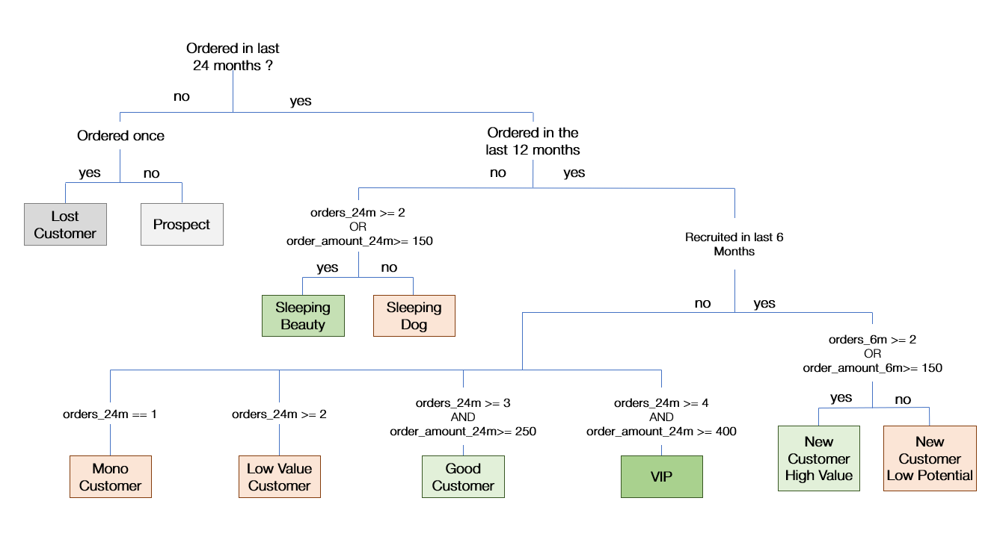

In [129]:
Image(filename='RFM.png', width=750, height=750)

#### iv) Project plan
> Discuss possible approaches and your resulting decisions for the project plan

Once project proposal has been potentially approves, we plan to 
- Change how dataset is created based on our initial EDA, meaning additional feature engineering, and this will change structure of our dataset, mainly reducing number of features and adding a few new ones. We will go into additional EDA before going into machine learning
- We will fit machine learning models (presented afterwards) and based on computational speed / feature importances results, we might go into an additional EDA.

### (c) What further EDA do you plan for project?
> Outline your plan for further EDA in the project

There are two factors that will imply further EDA 

__Creation of new features / Pruning of existing ones__
- Feature engineering and increasing normality of distribution will enable further visual investigation on outliers using pairplot.
- Further EDA on colinearity, normality, relation to log odds of target variable to see if features are linearly correlated with it.
- Creating new features could help to increase the predictive power of the model. Dwelling population density can provide insight into city or countryside home. Customer profiles could reveal better insights that only gender and language. Specific patterns of email interactions could confirm our intuition than interacting on PC is a valuable. Further EDA is also needed to know whether our category/subcategory/franchise/item are indeed useful, only subcategory seems valuable.

__Restriction of the dataset to three classes subset Good Customers, VIP, and Low Value Customers__
- We will regenerate a dataset keeping only those 3 classes, which will change the dataset size and EDA. Our original dataset is 867428 ligns and we kept a sample for analysis here of 264000. We will probably end up on three classes studying 100-200k samples.



## Saving subset before ML part

Before going to machine learning notebook, we save our current subset to pickle. 

We rerun our categorize_age function after having filled missing values for age.

In [130]:
df_subset = categorize_age(df_subset)

### Renaming

We also rename two columns for readability afterwards

In [131]:
df_subset = df_subset.rename(columns={'target_label_12M': 'target_label', 'rfm_labels': 'rfm_label'})

### Cleaning

- We drop zip_code as it is not engineered yet as a feature so unusable.
- We drop top items related categories also as we have seen they require further engineering.

In [132]:
columns_to_drop = ['zip_code',
                   'top_category',
                   'top_subcategory',
                   'top_franchise',
                   'top_item'
                  ]
df_subset.drop(columns=columns_to_drop, inplace=True)

In [133]:
df_subset.to_pickle("./datasubset.pkl")

In [134]:
df_subset.shape

(63798, 74)